# Part 0: Introduction

The purpose of the case study is to classify a given silhouette as one of four different types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

# Part I: Preparation

Importing all the libraries which might be useful

In [1]:
%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from IPython.display import Image  
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn import model_selection
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score


warnings.filterwarnings('ignore')

**Importing the data**

In [2]:
data = pd.read_csv('vehicle.csv')

**Making copies of the dataset in case we might require the original data**

In [3]:
original = data.copy()
data2 = data.copy()

**Checking the first 5 values**

In [4]:
data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


**Checking the last 5 values**

In [5]:
data.tail()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio,class
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car
845,85,36.0,66.0,123.0,55.0,5,120.0,56.0,17.0,128,140.0,212.0,131.0,73.0,1.0,18.0,186.0,190,van


**Looking at the IQRs, 5 Number summary, STD, Mean of the dataset**

In [6]:
data.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr_axis_aspect_ratio           844 non-null float64
max_length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr_axis_rectangularity         843 non-null float64
max_length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance_1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration_1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about_1               845 non-null float64
skewness_about_2               845 non-null float64
hollows_ratio    

**Above we see that we have 14 float datatypes, 4 integer datatypes and 1 object datatype (this is the class variable)**

In [8]:
data.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr_axis_aspect_ratio           2
max_length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr_axis_rectangularity         3
max_length_rectangularity      0
scaled_variance                3
scaled_variance_1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration_1    4
skewness_about                 6
skewness_about_1               1
skewness_about_2               1
hollows_ratio                  0
class                          0
dtype: int64

**As seen above, we have found a few null values in certain columns. These values must be replaced by an appropriate value. In our case, we will replace it with the median value of the dataset**

In [9]:
for i in data.columns[:17]:
    m_value = data[i].median()
    data[i] = data[i].fillna(m_value)

In [10]:
data.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr_axis_aspect_ratio           0
max_length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr_axis_rectangularity         0
max_length_rectangularity      0
scaled_variance                0
scaled_variance_1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration_1    0
skewness_about                 0
skewness_about_1               0
skewness_about_2               0
hollows_ratio                  0
class                          0
dtype: int64

**As seen above, we have completely replaced all NaN values with the median value of the dataset**

Text(0.5, 0, 'Class')

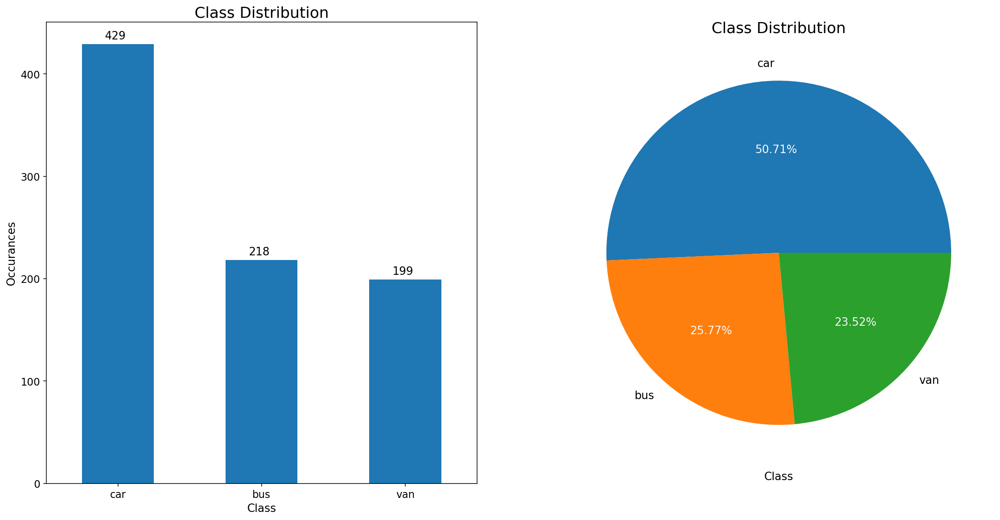

In [11]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(20,10)) 

data['class'].value_counts().plot(kind = 'bar', ax = ax1)
ax1.set_title("Class Distribution", fontsize = 18)
ax1.set_xlabel("Class", fontsize = 13)
ax1.set_ylabel("Occurances", fontsize = 13)
ax1.tick_params(rotation = 0, labelsize = 12)
for i in ax1.patches:
    ax1.text(i.get_x()+0.16, i.get_height()+5, str(round((i.get_height()), 2)), fontsize=13, color='black')

data['class'].value_counts().plot(kind = 'pie',autopct = "%.2f%%", label = "", fontsize = 13, ax = ax2)
wedgeprops = {"linewidth": 1.5, "edgecolor": "#F7F7F7"}
ax2.texts[3].set_color("#F7F7F7"), ax2.texts[5].set_color("#F7F7F7"), ax2.texts[1].set_color("#F7F7F7")
ax2.set_title("Class Distribution", fontsize = 18)
ax2.set_xlabel("Class", fontsize = 13)

**Above, we see that we have somewhat an even distribution of classes, but with a higher number of occurances in the 'car' class. I do not expect that this slight imbalance will affect the model tuning and prediction, however, we may do balancing and check accuracy again later on to confirm**

# Part 2: Exploratory Data Analytics

## Univariate Analysis

### Compactness

**Defining Function for detecting Outliers**

In [12]:
out=[]

def outliers(data_1):
    
    threshold=3
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)
    
    
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            out.append(y)
    print(out)

In [13]:
print("Min Value = ", data.compactness.quantile(0))
print("Q1 or 25% = ", data.compactness.quantile(0.25))
print("Q2/Median = ", data.compactness.quantile(0.5))
print("Q3 or 75% = ", data.compactness.quantile(0.75))
print("Max value = ", data.compactness.quantile(1))
print("Interquartile Range = ", stats.iqr(data.compactness))
print("Mean value = %.3f" % np.mean(data.compactness))

Min Value =  73.0
Q1 or 25% =  87.0
Q2/Median =  93.0
Q3 or 75% =  100.0
Max value =  119.0
Interquartile Range =  13.0
Mean value = 93.678


In [14]:
print("The list of outliers is: ")
outliers(data.compactness)

The list of outliers is: 
[119]


In [15]:
out = []

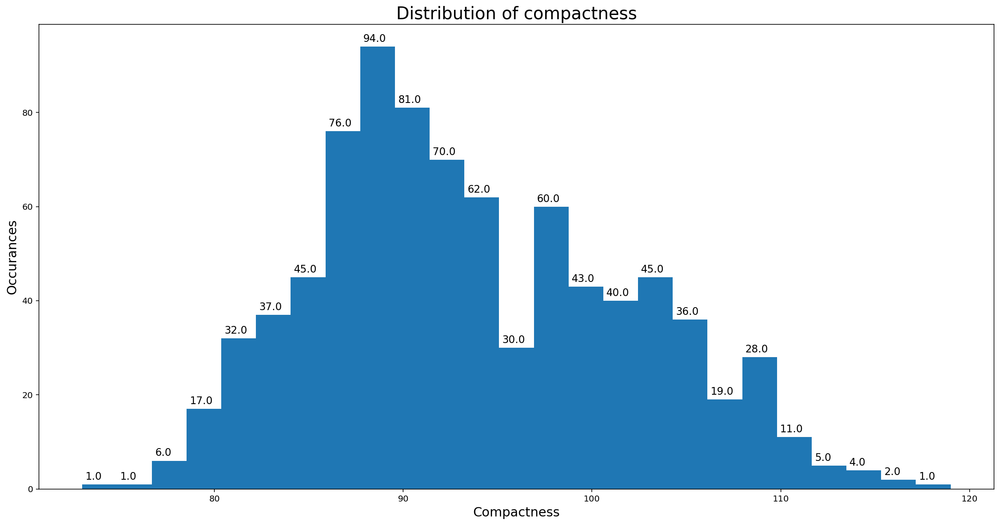

In [16]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("Compactness", fontsize = 15)

ax.set_ylabel("Occurances", fontsize = 15)

ax.set_title("Distribution of compactness", fontsize = 20)

plt.hist(data.compactness,bins = 25, histtype = 'bar', range = (data.compactness.min(),data.compactness.max()));
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data looks to be slightly skewed right

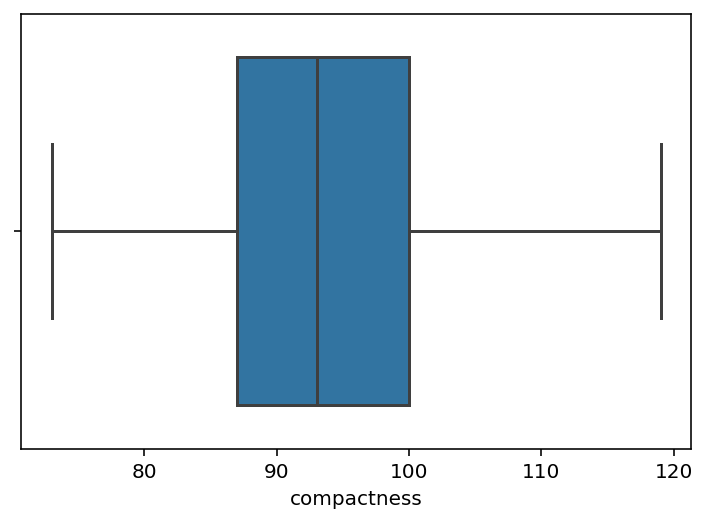

In [17]:
sns.boxplot(x=data['compactness'], data=data)

### Circularity

In [18]:
print("Min Value = ", data.circularity.quantile(0))
print("Q1 or 25% = ", data.circularity.quantile(0.25))
print("Q2/Median = ", data.circularity.quantile(0.5))
print("Q3 or 75% = ", data.circularity.quantile(0.75))
print("Max value = ", data.circularity.quantile(1))
print("Interquartile Range = ", stats.iqr(data.circularity))
print("Mean value = %.3f" % np.mean(data.circularity))

Min Value =  33.0
Q1 or 25% =  40.0
Q2/Median =  44.0
Q3 or 75% =  49.0
Max value =  59.0
Interquartile Range =  9.0
Mean value = 44.824


In [19]:
print("The list of outliers is: ")
outliers(data.circularity)

The list of outliers is: 
[]


In [20]:
out=[]

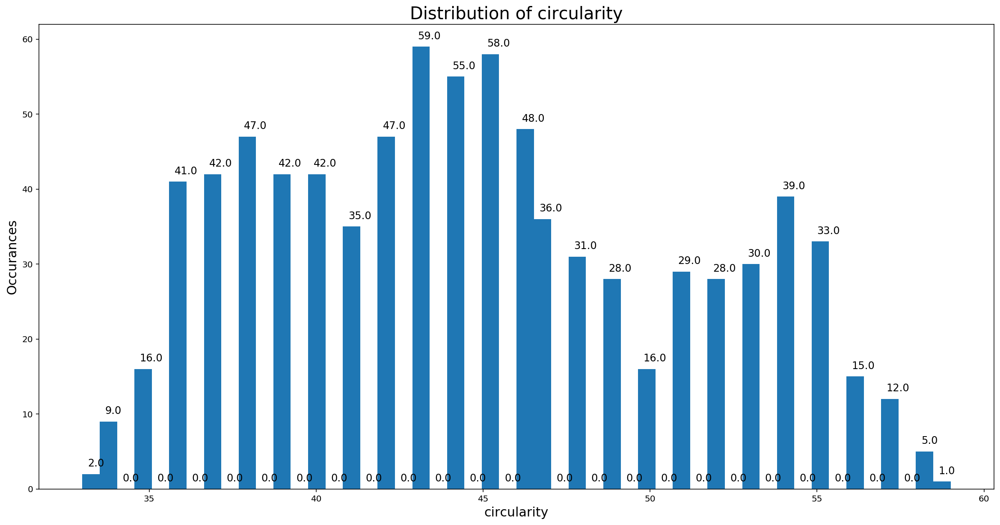

In [21]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("circularity", fontsize = 15)

ax.set_ylabel("Occurances", fontsize = 15)

ax.set_title("Distribution of circularity", fontsize = 20)

plt.hist(data.circularity,bins = 50, histtype = 'bar', range = (data.circularity.min(),data.circularity.max()));
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The looks to be slightly skewed right

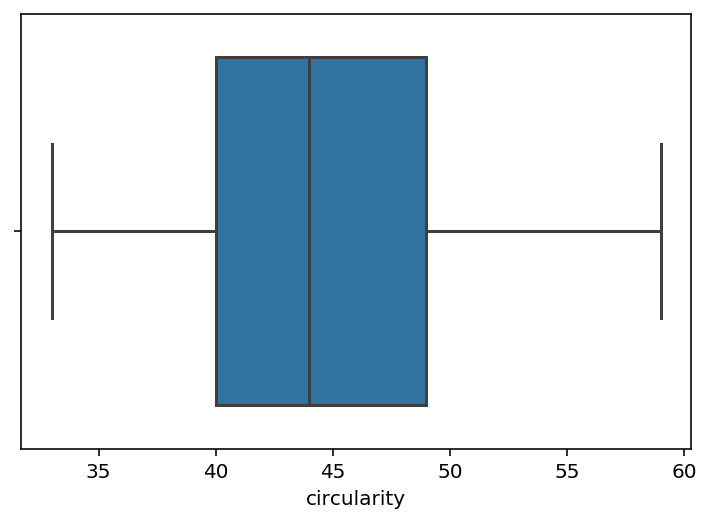

In [22]:
sns.boxplot(x=data['circularity'], data=data)

### distance_circularity 

In [23]:
print("Min Value = ", data.distance_circularity.quantile(0))
print("Q1 or 25% = ", data.distance_circularity.quantile(0.25))
print("Q2/Median = ", data.distance_circularity.quantile(0.5))
print("Q3 or 75% = ", data.distance_circularity.quantile(0.75))
print("Max value = ", data.distance_circularity.quantile(1))
print("Interquartile Range = ", stats.iqr(data.distance_circularity))
print("Mean value = %.3f" % np.mean(data.distance_circularity))
print("The list of outliers is: ")

Min Value =  40.0
Q1 or 25% =  70.0
Q2/Median =  80.0
Q3 or 75% =  98.0
Max value =  112.0
Interquartile Range =  28.0
Mean value = 82.100
The list of outliers is: 


In [24]:
outliers(data.distance_circularity)

[]


In [25]:
out=[]

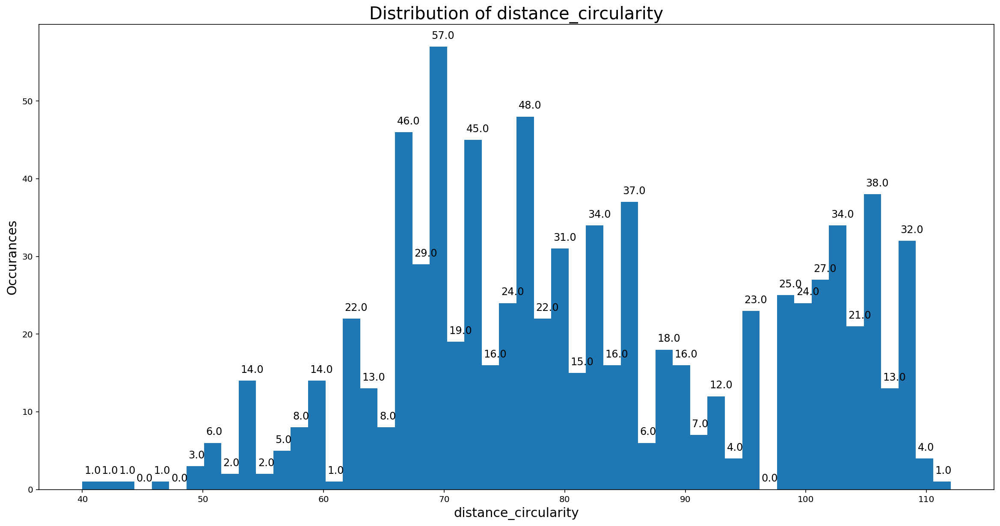

In [26]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("distance_circularity", fontsize = 15)

ax.set_ylabel("Occurances", fontsize = 15)

ax.set_title("Distribution of distance_circularity", fontsize = 20)

plt.hist(data.distance_circularity,bins = 50, histtype = 'bar', range = (data.distance_circularity.min(),data.distance_circularity.max()));
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data looks to be slightly skewed left

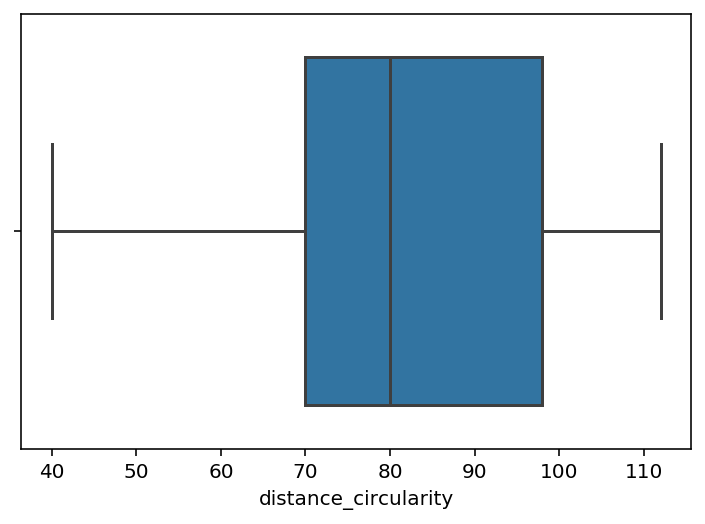

In [27]:
sns.boxplot(x=data['distance_circularity'], data=data)

### radius_ratio

In [28]:
print("Min Value = ", data.radius_ratio.quantile(0))
print("Q1 or 25% = ", data.radius_ratio.quantile(0.25))
print("Q2/Median = ", data.radius_ratio.quantile(0.5))
print("Q3 or 75% = ", data.radius_ratio.quantile(0.75))
print("Max value = ", data.radius_ratio.quantile(1))
print("Interquartile Range = ", stats.iqr(data.radius_ratio))
print("Mean value = %.3f" % np.mean(data.radius_ratio))
print("The list of outliers is: ")

Min Value =  104.0
Q1 or 25% =  141.0
Q2/Median =  167.0
Q3 or 75% =  195.0
Max value =  333.0
Interquartile Range =  54.0
Mean value = 168.875
The list of outliers is: 


In [29]:
outliers(data.radius_ratio)

[306.0, 322.0, 333.0]


In [30]:
out=[]

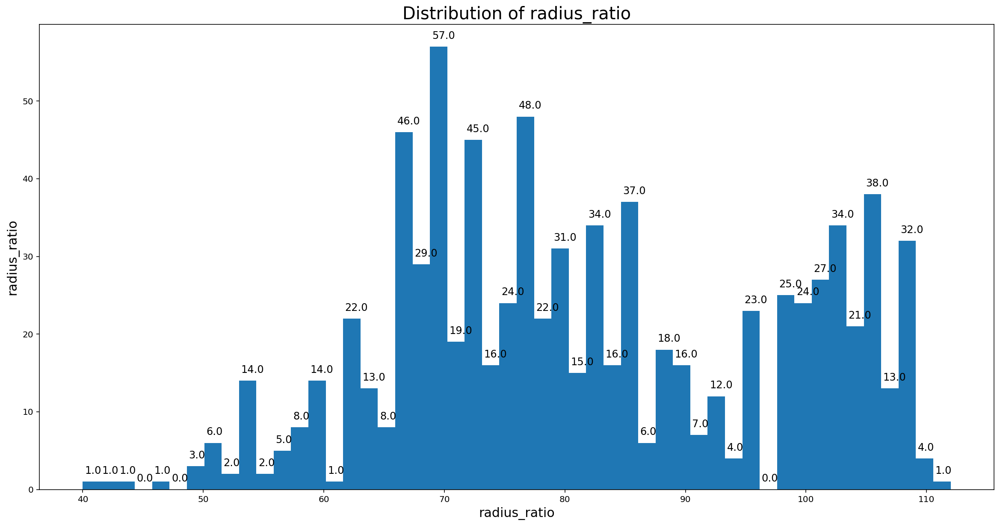

In [31]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("radius_ratio", fontsize = 15)

ax.set_ylabel("radius_ratio", fontsize = 15)

ax.set_title("Distribution of radius_ratio", fontsize = 20)

plt.hist(data.distance_circularity,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data looks to be slightly skewed left

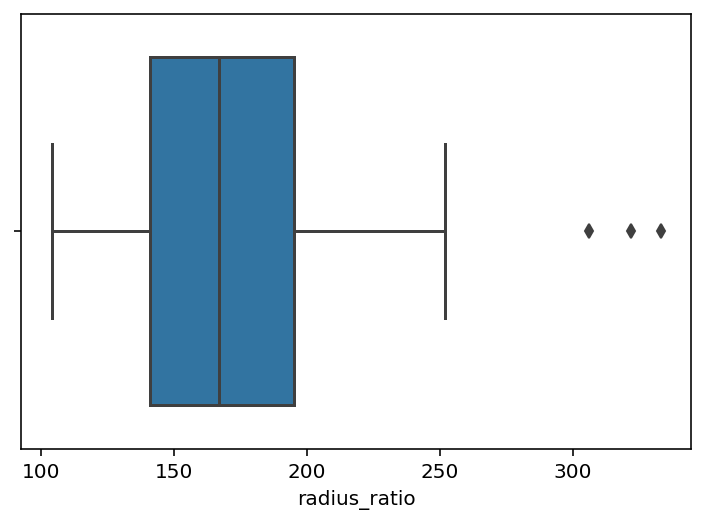

In [32]:
sns.boxplot(x=data['radius_ratio'], data=data)

### pr.axis_aspect_ratio

In [33]:
print("Min Value = ", data.pr_axis_aspect_ratio.quantile(0))
print("Q1 or 25% = ", data.pr_axis_aspect_ratio.quantile(0.25))
print("Q2/Median = ", data.pr_axis_aspect_ratio.quantile(0.5))
print("Q3 or 75% = ", data.pr_axis_aspect_ratio.quantile(0.75))
print("Max value = ", data.pr_axis_aspect_ratio.quantile(1))
print("Interquartile Range = ", stats.iqr(data.pr_axis_aspect_ratio))
print("Mean value = %.3f" % np.mean(data.pr_axis_aspect_ratio))
print("The list of outliers is: ")

Min Value =  47.0
Q1 or 25% =  57.0
Q2/Median =  61.0
Q3 or 75% =  65.0
Max value =  138.0
Interquartile Range =  8.0
Mean value = 61.677
The list of outliers is: 


In [34]:
print("The list of outliers is: ")
outliers(data.pr_axis_aspect_ratio)

The list of outliers is: 
[103.0, 126.0, 126.0, 133.0, 102.0, 138.0, 97.0, 105.0]


In [35]:
out = []

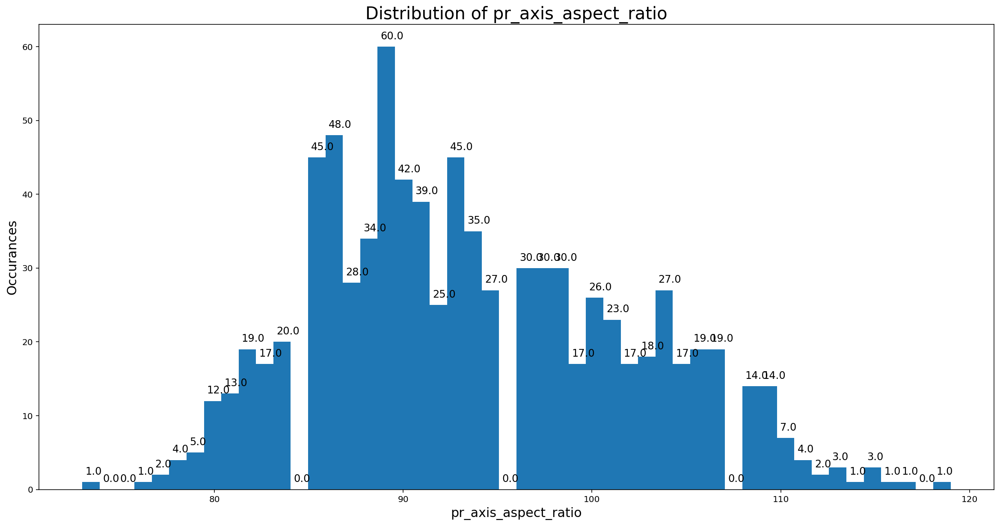

In [36]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("pr_axis_aspect_ratio", fontsize = 15)

ax.set_ylabel("Occurances", fontsize = 15)

ax.set_title("Distribution of pr_axis_aspect_ratio", fontsize = 20)

plt.hist(data.compactness,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data looks to be slightly skewed right

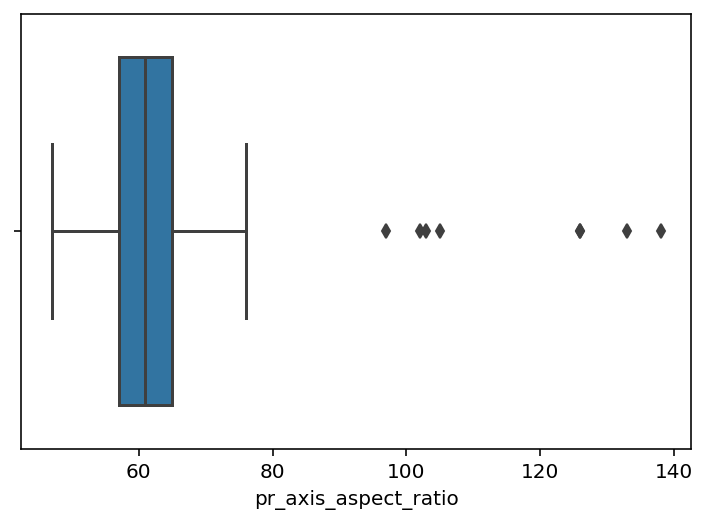

In [37]:
sns.boxplot(x=data['pr_axis_aspect_ratio'], data=data)

### max_length_aspect_ratio	 

In [38]:
print("Min Value = ", data.max_length_aspect_ratio.quantile(0))
print("Q1 or 25% = ", data.max_length_aspect_ratio.quantile(0.25))
print("Q2/Median = ", data.max_length_aspect_ratio.quantile(0.5))
print("Q3 or 75% = ", data.max_length_aspect_ratio.quantile(0.75))
print("Max value = ", data.max_length_aspect_ratio.quantile(1))
print("Interquartile Range = ", stats.iqr(data.max_length_aspect_ratio))
print("Mean value = %.3f" % np.mean(data.max_length_aspect_ratio))
print("The list of outliers is: ")

Min Value =  2.0
Q1 or 25% =  7.0
Q2/Median =  8.0
Q3 or 75% =  10.0
Max value =  55.0
Interquartile Range =  3.0
Mean value = 8.567
The list of outliers is: 


In [39]:
outliers(data.max_length_aspect_ratio)

[52, 49, 52, 48, 43, 49, 25, 46, 55]


In [40]:
out=[]

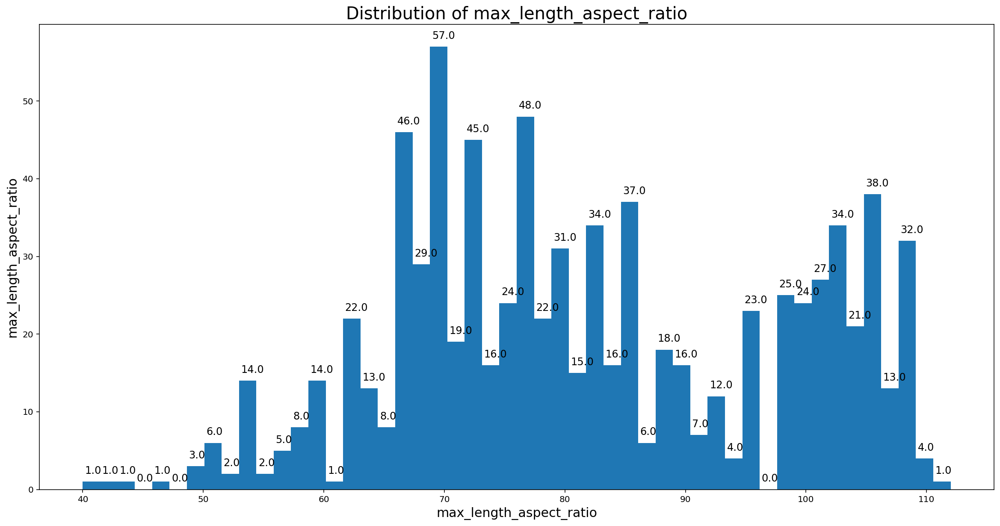

In [41]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("max_length_aspect_ratio", fontsize = 15)

ax.set_ylabel("max_length_aspect_ratio", fontsize = 15)

ax.set_title("Distribution of max_length_aspect_ratio", fontsize = 20)

plt.hist(data.distance_circularity,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data seems to be slightly skewed left

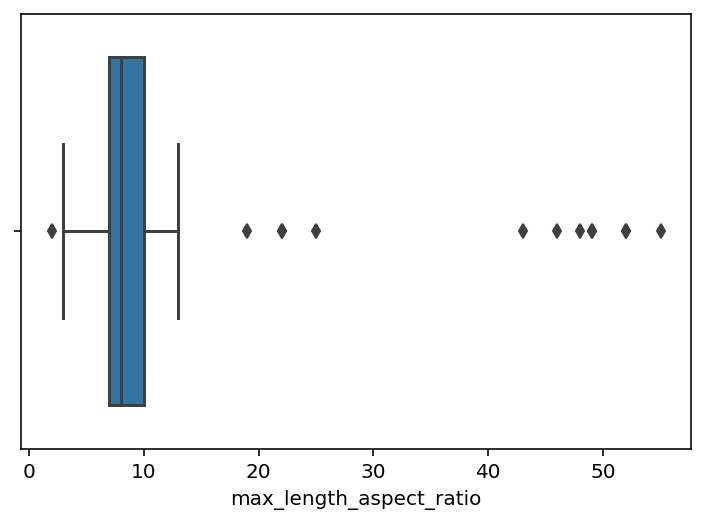

In [42]:
sns.boxplot(x=data['max_length_aspect_ratio'], data=data)

### scatter_ratio 

In [43]:
print("Min Value = ", data.scatter_ratio.quantile(0))
print("Q1 or 25% = ", data.scatter_ratio.quantile(0.25))
print("Q2/Median = ", data.scatter_ratio.quantile(0.5))
print("Q3 or 75% = ", data.scatter_ratio.quantile(0.75))
print("Max value = ", data.scatter_ratio.quantile(1))
print("Interquartile Range = ", stats.iqr(data.scatter_ratio))
print("Mean value = %.3f" % np.mean(data.scatter_ratio))
print("The list of outliers is: ")

Min Value =  112.0
Q1 or 25% =  147.0
Q2/Median =  157.0
Q3 or 75% =  198.0
Max value =  265.0
Interquartile Range =  51.0
Mean value = 168.888
The list of outliers is: 


In [44]:
outliers(data.scatter_ratio)

[]


In [45]:
out = []

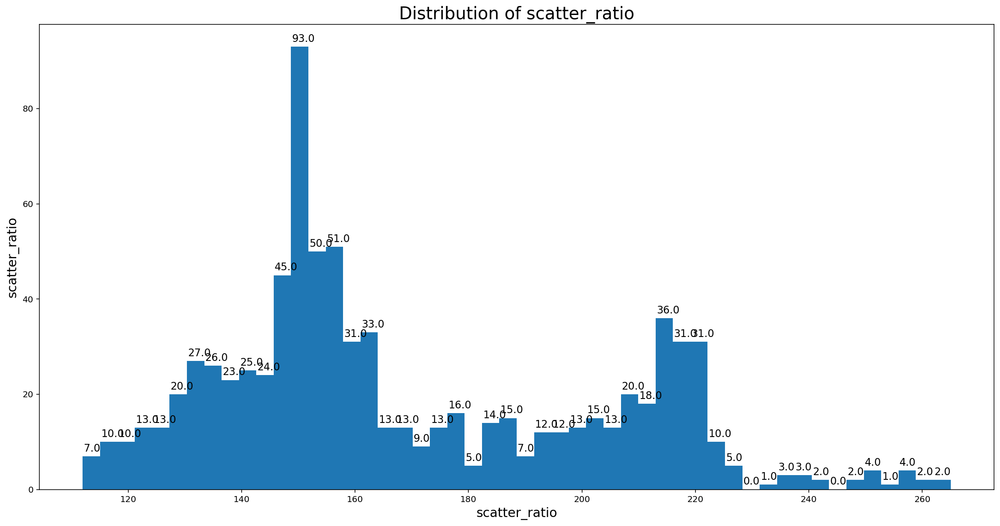

In [46]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("scatter_ratio", fontsize = 15)

ax.set_ylabel("scatter_ratio", fontsize = 15)

ax.set_title("Distribution of scatter_ratio", fontsize = 20)

plt.hist(data.scatter_ratio,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data seems to be slightly skewed right

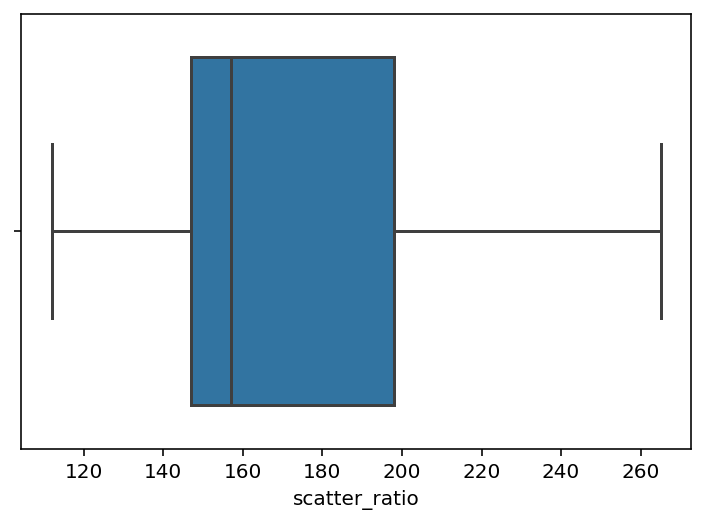

In [47]:
sns.boxplot(x=data['scatter_ratio'], data=data)

###  elongatedness

In [48]:
print("Min Value = ", data.elongatedness.quantile(0))
print("Q1 or 25% = ", data.elongatedness.quantile(0.25))
print("Q2/Median = ", data.elongatedness.quantile(0.5))
print("Q3 or 75% = ", data.elongatedness.quantile(0.75))
print("Max value = ", data.elongatedness.quantile(1))
print("Interquartile Range = ", stats.iqr(data.elongatedness))
print("Mean value = %.3f" % np.mean(data.elongatedness))
print("The list of outliers is: ")

Min Value =  26.0
Q1 or 25% =  33.0
Q2/Median =  43.0
Q3 or 75% =  46.0
Max value =  61.0
Interquartile Range =  13.0
Mean value = 40.936
The list of outliers is: 


In [49]:
outliers(data.elongatedness)

[]


In [50]:
out = []

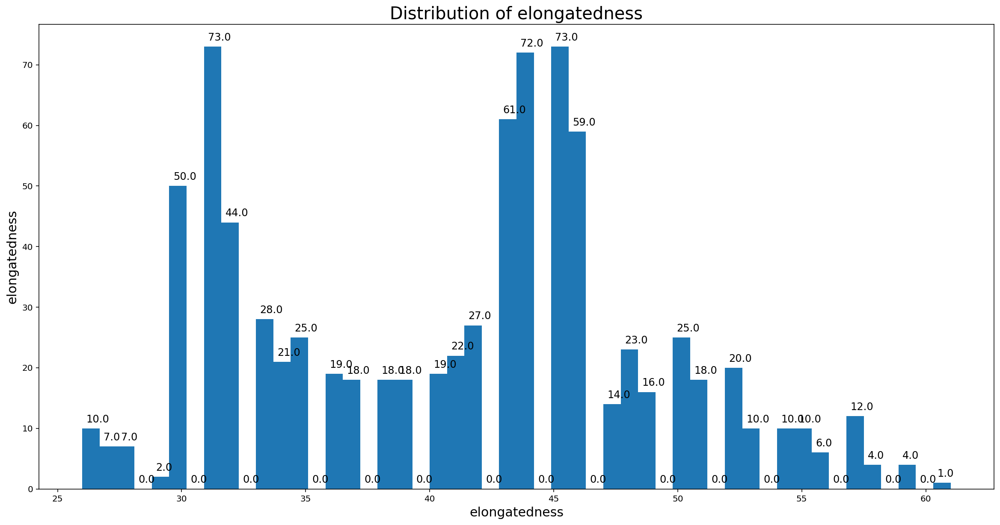

In [51]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("elongatedness", fontsize = 15)

ax.set_ylabel("elongatedness", fontsize = 15)

ax.set_title("Distribution of elongatedness", fontsize = 20)

plt.hist(data.elongatedness,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data seems to be skewed right slightly

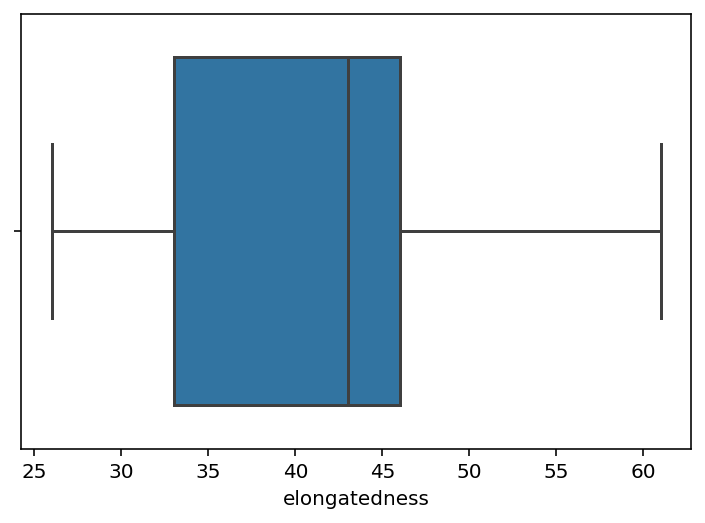

In [52]:
sns.boxplot(x=data['elongatedness'], data=data)

### pr_axis_rectangularity

In [53]:
print("Min Value = ", data.pr_axis_rectangularity.quantile(0))
print("Q1 or 25% = ", data.pr_axis_rectangularity.quantile(0.25))
print("Q2/Median = ", data.pr_axis_rectangularity.quantile(0.5))
print("Q3 or 75% = ", data.pr_axis_rectangularity.quantile(0.75))
print("Max value = ", data.pr_axis_rectangularity.quantile(1))
print("Interquartile Range = ", stats.iqr(data.pr_axis_rectangularity))
print("Mean value = %.3f" % np.mean(data.pr_axis_rectangularity))
print("The list of outliers is: ")

Min Value =  17.0
Q1 or 25% =  19.0
Q2/Median =  20.0
Q3 or 75% =  23.0
Max value =  29.0
Interquartile Range =  4.0
Mean value = 20.580
The list of outliers is: 


In [54]:
outliers(data.pr_axis_rectangularity)

[29.0]


In [55]:
out = []

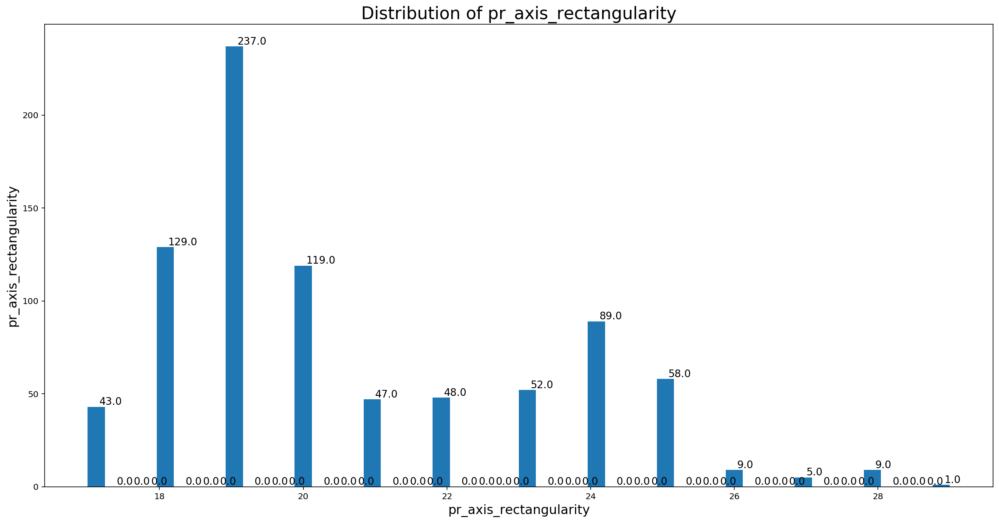

In [56]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("pr_axis_rectangularity", fontsize = 15)

ax.set_ylabel("pr_axis_rectangularity", fontsize = 15)

ax.set_title("Distribution of pr_axis_rectangularity", fontsize = 20)

plt.hist(data.pr_axis_rectangularity,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data seems skewed slightly right

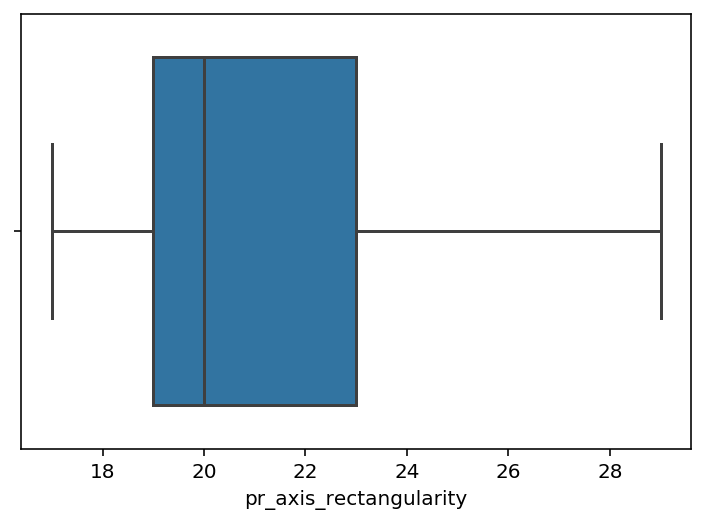

In [57]:
sns.boxplot(x=data['pr_axis_rectangularity'], data=data)

### max_length_rectangularity	

In [58]:
print("Min Value = ", data.max_length_rectangularity.quantile(0))
print("Q1 or 25% = ", data.max_length_rectangularity.quantile(0.25))
print("Q2/Median = ", data.max_length_rectangularity.quantile(0.5))
print("Q3 or 75% = ", data.max_length_rectangularity.quantile(0.75))
print("Max value = ", data.max_length_rectangularity.quantile(1))
print("Interquartile Range = ", stats.iqr(data.max_length_rectangularity))
print("Mean value = %.3f" % np.mean(data.max_length_rectangularity))
print("The list of outliers is: ")

Min Value =  118.0
Q1 or 25% =  137.0
Q2/Median =  146.0
Q3 or 75% =  159.0
Max value =  188.0
Interquartile Range =  22.0
Mean value = 147.999
The list of outliers is: 


In [59]:
outliers(data.max_length_rectangularity)

[]


In [60]:
out = []

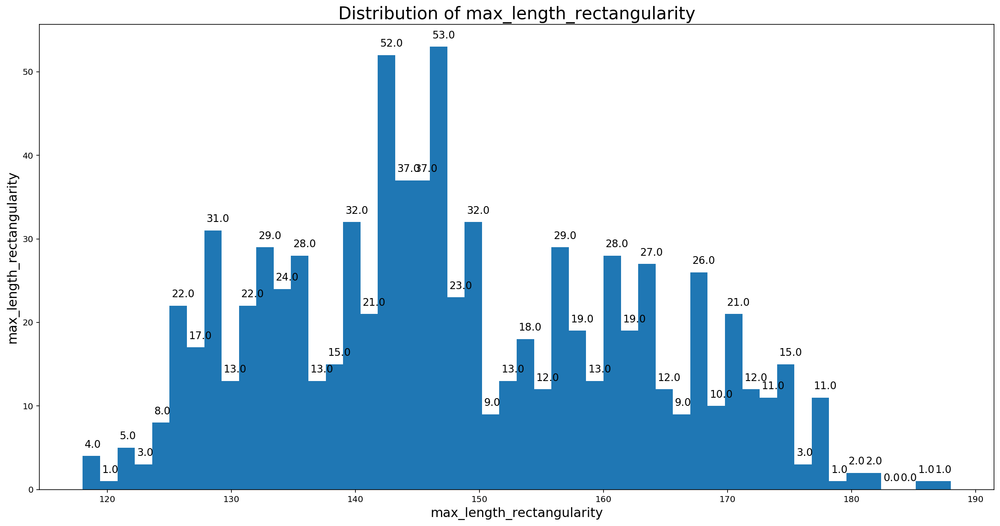

In [61]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("max_length_rectangularity", fontsize = 15)

ax.set_ylabel("max_length_rectangularity", fontsize = 15)

ax.set_title("Distribution of max_length_rectangularity", fontsize = 20)

plt.hist(data.max_length_rectangularity,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data doesn't seems skewed but is not normal

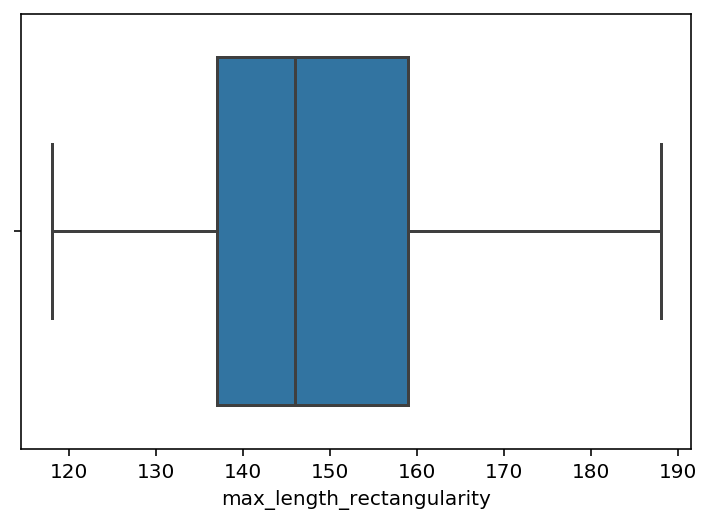

In [62]:
sns.boxplot(x=data['max_length_rectangularity'], data=data)

### scaled_variance

In [63]:
print("Min Value = ", data.scaled_variance.quantile(0))
print("Q1 or 25% = ", data.scaled_variance.quantile(0.25))
print("Q2/Median = ", data.scaled_variance.quantile(0.5))
print("Q3 or 75% = ", data.scaled_variance.quantile(0.75))
print("Max value = ", data.scaled_variance.quantile(1))
print("Interquartile Range = ", stats.iqr(data.scaled_variance))
print("Mean value = %.3f" % np.mean(data.scaled_variance))
print("The list of outliers is: ")

Min Value =  130.0
Q1 or 25% =  167.0
Q2/Median =  179.0
Q3 or 75% =  217.0
Max value =  320.0
Interquartile Range =  50.0
Mean value = 188.597
The list of outliers is: 


In [64]:
outliers(data.scaled_variance)

[288.0, 320.0, 285.0, 285.0, 287.0, 285.0]


In [65]:
out = []

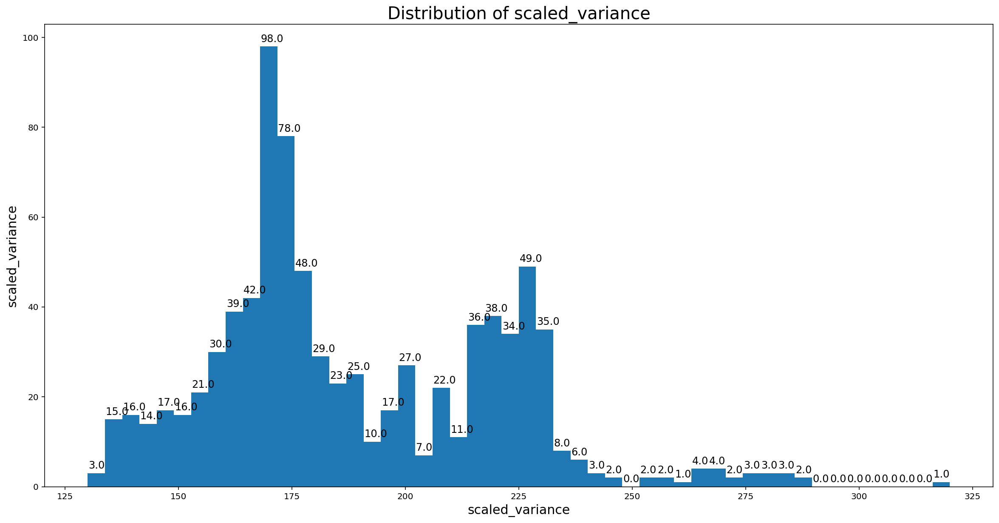

In [66]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("scaled_variance", fontsize = 15)

ax.set_ylabel("scaled_variance", fontsize = 15)

ax.set_title("Distribution of scaled_variance", fontsize = 20)

plt.hist(data.scaled_variance,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

The data seems skewed right

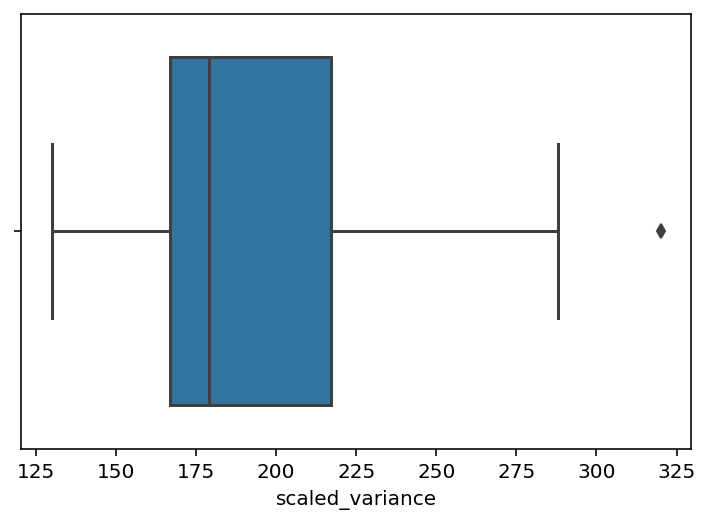

In [67]:
sns.boxplot(x=data['scaled_variance'], data=data)

### scaled_variance_1 

In [68]:
print("Min Value = ", data.scaled_variance_1.quantile(0))
print("Q1 or 25% = ", data.scaled_variance_1.quantile(0.25))
print("Q2/Median = ", data.scaled_variance_1.quantile(0.5))
print("Q3 or 75% = ", data.scaled_variance_1.quantile(0.75))
print("Max value = ", data.scaled_variance_1.quantile(1))
print("Interquartile Range = ", stats.iqr(data.scaled_variance_1))
print("Mean value = %.3f" % np.mean(data.scaled_variance_1))
print("The list of outliers is: ")

Min Value =  184.0
Q1 or 25% =  318.25
Q2/Median =  363.5
Q3 or 75% =  586.75
Max value =  1018.0
Interquartile Range =  268.5
Mean value = 439.314
The list of outliers is: 


In [69]:
outliers(data.scaled_variance_1)

[998.0, 982.0, 987.0, 1018.0]


In [70]:
out = []

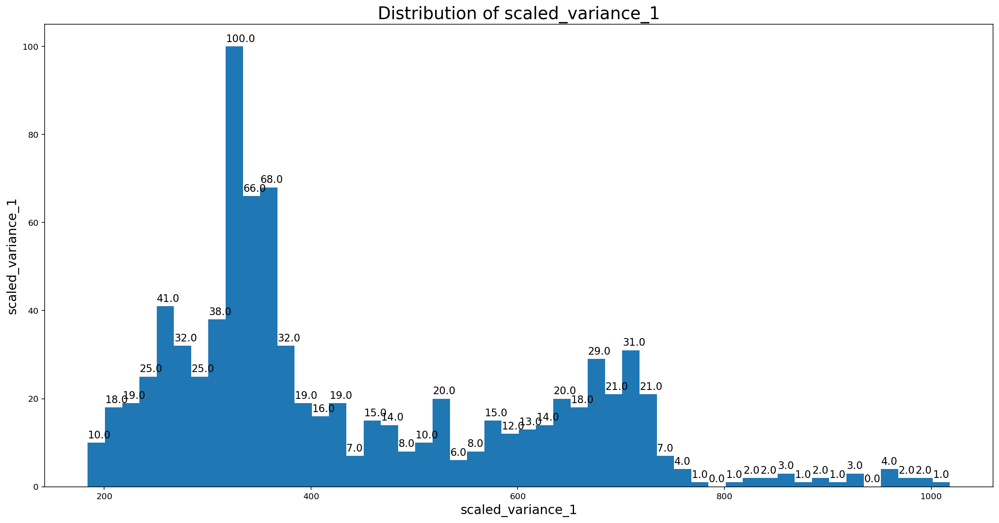

In [71]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("scaled_variance_1", fontsize = 15)

ax.set_ylabel("scaled_variance_1", fontsize = 15)

ax.set_title("Distribution of scaled_variance_1", fontsize = 20)

plt.hist(data.scaled_variance_1,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data seems to be skewed right

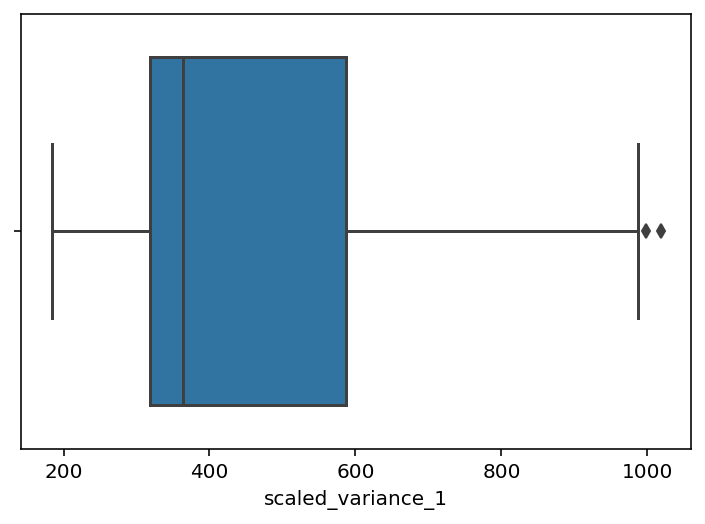

In [72]:
sns.boxplot(x=data['scaled_variance_1'], data=data)

### scaled_radius_of_gyration	

In [73]:
print("Min Value = ", data.scaled_radius_of_gyration.quantile(0))
print("Q1 or 25% = ", data.scaled_radius_of_gyration.quantile(0.25))
print("Q2/Median = ", data.scaled_radius_of_gyration.quantile(0.5))
print("Q3 or 75% = ", data.scaled_radius_of_gyration.quantile(0.75))
print("Max value = ", data.scaled_radius_of_gyration.quantile(1))
print("Interquartile Range = ", stats.iqr(data.scaled_radius_of_gyration))
print("Mean value = %.3f" % np.mean(data.scaled_radius_of_gyration))
print("The list of outliers is: ")

Min Value =  109.0
Q1 or 25% =  149.0
Q2/Median =  173.5
Q3 or 75% =  198.0
Max value =  268.0
Interquartile Range =  49.0
Mean value = 174.707
The list of outliers is: 


In [74]:
outliers(data.scaled_radius_of_gyration)

[]


In [75]:
out = []

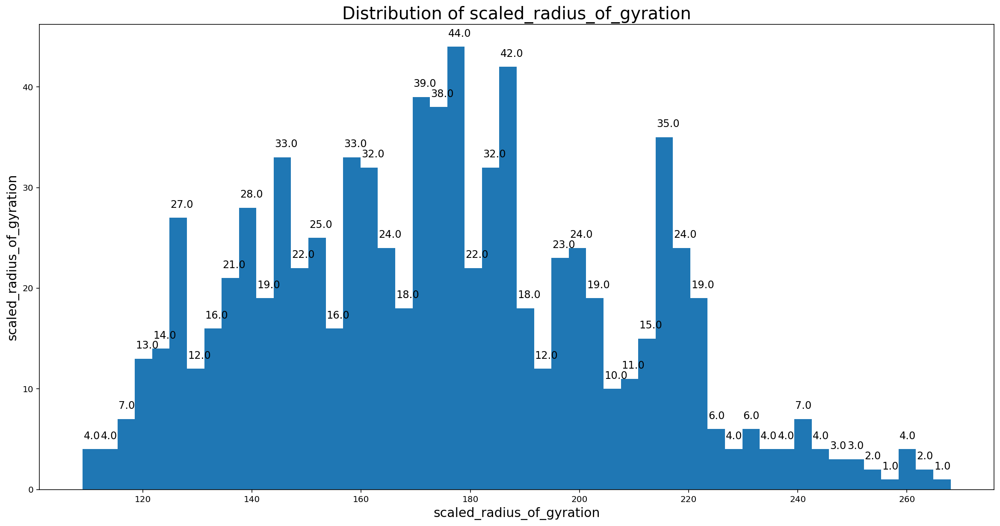

In [76]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("scaled_radius_of_gyration", fontsize = 15)

ax.set_ylabel("scaled_radius_of_gyration", fontsize = 15)

ax.set_title("Distribution of scaled_radius_of_gyration", fontsize = 20)

plt.hist(data.scaled_radius_of_gyration,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data seems to be slightly skewed right

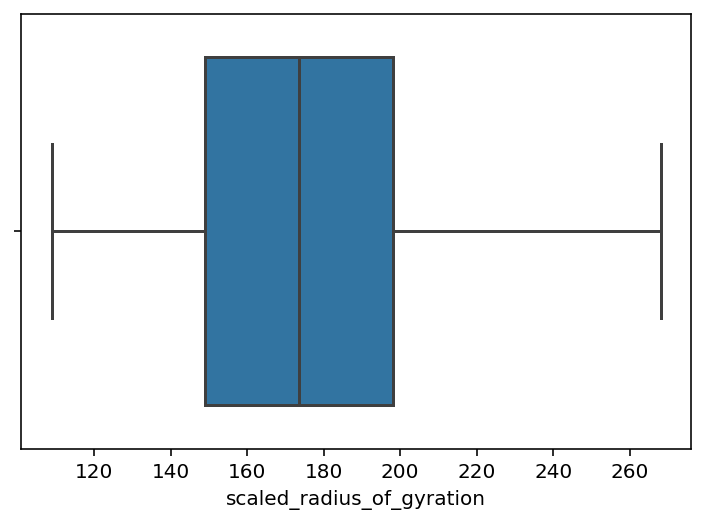

In [77]:
sns.boxplot(x=data['scaled_radius_of_gyration'], data=data)

### scaled_radius_of_gyration_1

In [78]:
print("Min Value = ", data.scaled_radius_of_gyration_1.quantile(0))
print("Q1 or 25% = ", data.scaled_radius_of_gyration_1.quantile(0.25))
print("Q2/Median = ", data.scaled_radius_of_gyration_1.quantile(0.5))
print("Q3 or 75% = ", data.scaled_radius_of_gyration_1.quantile(0.75))
print("Max value = ", data.scaled_radius_of_gyration_1.quantile(1))
print("Interquartile Range = ", stats.iqr(data.scaled_radius_of_gyration_1))
print("Mean value = %.3f" % np.mean(data.scaled_radius_of_gyration_1))
print("The list of outliers is: ")

Min Value =  59.0
Q1 or 25% =  67.0
Q2/Median =  71.5
Q3 or 75% =  75.0
Max value =  135.0
Interquartile Range =  8.0
Mean value = 72.443
The list of outliers is: 


In [79]:
outliers(data.scaled_radius_of_gyration_1)

[127.0, 118.0, 119.0, 97.0, 135.0, 99.0]


In [80]:
out = []

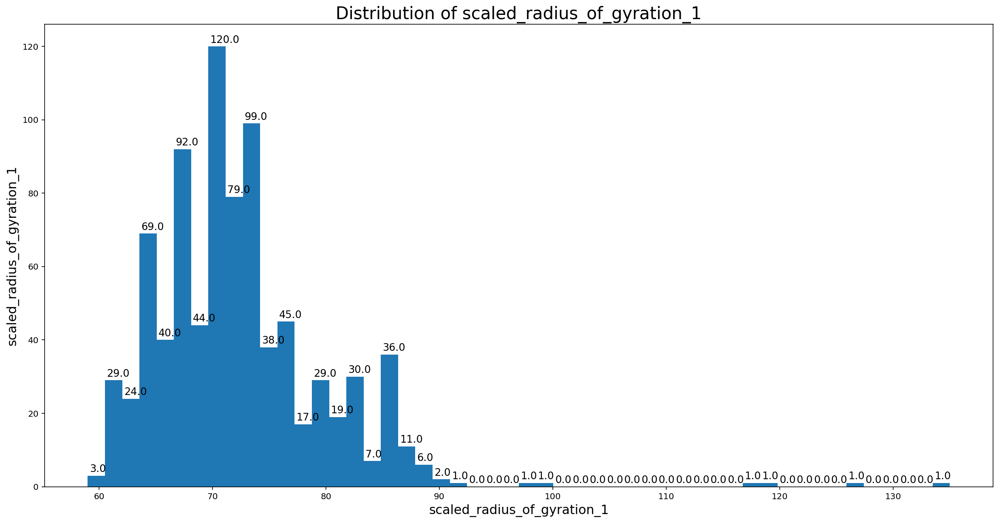

In [81]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("scaled_radius_of_gyration_1", fontsize = 15)

ax.set_ylabel("scaled_radius_of_gyration_1", fontsize = 15)

ax.set_title("Distribution of scaled_radius_of_gyration_1", fontsize = 20)

plt.hist(data.scaled_radius_of_gyration_1,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data seems to be skewed right slightly

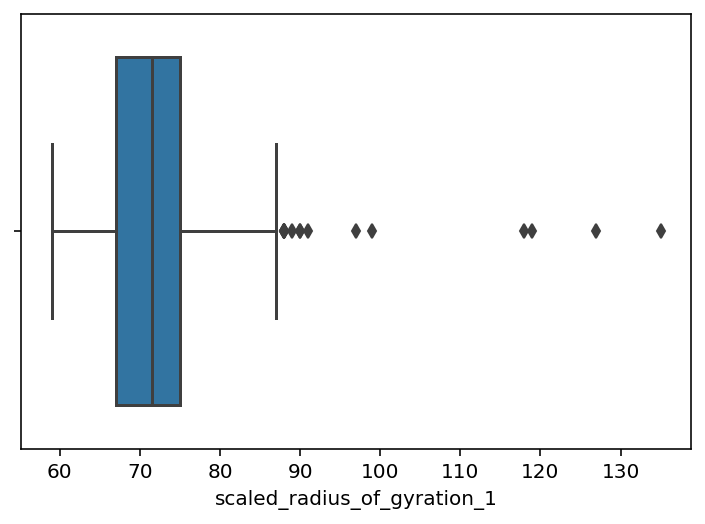

In [82]:
sns.boxplot(x=data['scaled_radius_of_gyration_1'], data=data)

### skewness_about 

In [83]:
print("Min Value = ", data.skewness_about.quantile(0))
print("Q1 or 25% = ", data.skewness_about.quantile(0.25))
print("Q2/Median = ", data.skewness_about.quantile(0.5))
print("Q3 or 75% = ", data.skewness_about.quantile(0.75))
print("Max value = ", data.skewness_about.quantile(1))
print("Interquartile Range = ", stats.iqr(data.skewness_about))
print("Mean value = %.3f" % np.mean(data.skewness_about))
print("The list of outliers is: ")

Min Value =  0.0
Q1 or 25% =  2.0
Q2/Median =  6.0
Q3 or 75% =  9.0
Max value =  22.0
Interquartile Range =  7.0
Mean value = 6.362
The list of outliers is: 


In [84]:
outliers(data.skewness_about)

[22.0, 22.0, 22.0, 22.0]


In [85]:
out = []

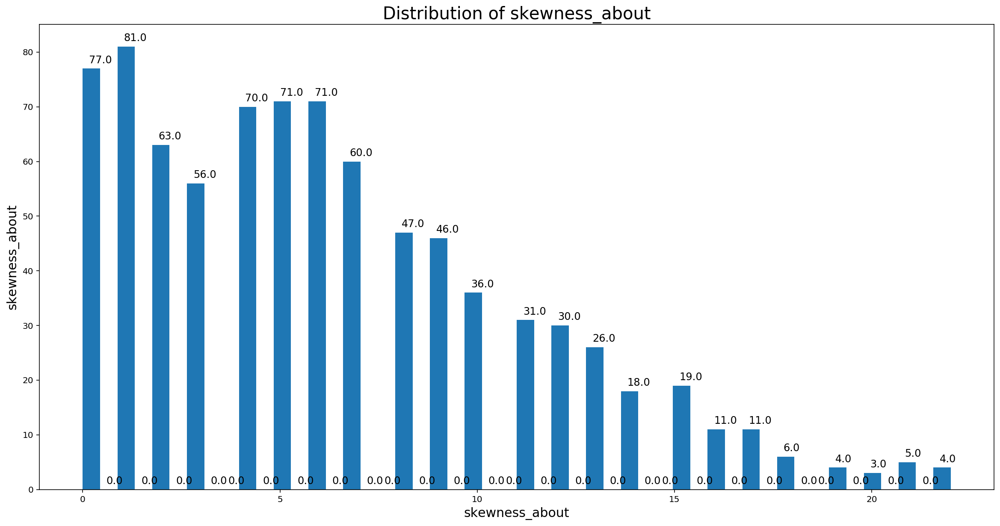

In [86]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("skewness_about", fontsize = 15)

ax.set_ylabel("skewness_about", fontsize = 15)

ax.set_title("Distribution of skewness_about", fontsize = 20)

plt.hist(data.skewness_about,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data is skewed right

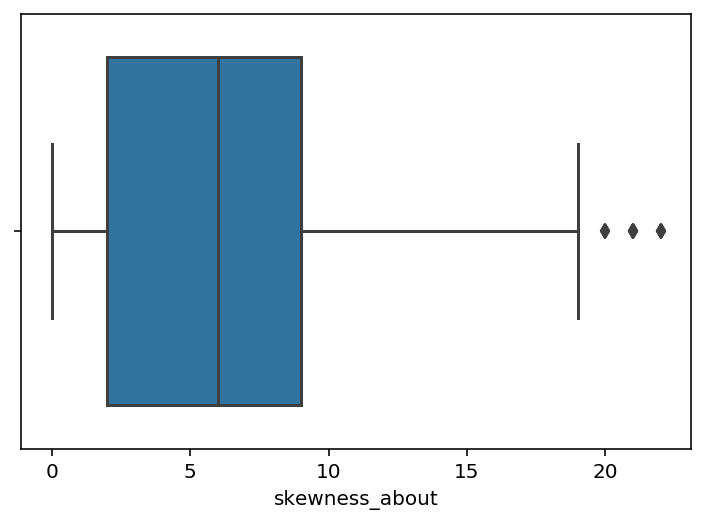

In [87]:
sns.boxplot(x=data['skewness_about'], data=data)

### skewness_about_1 

In [88]:
print("Min Value = ", data.skewness_about_1.quantile(0))
print("Q1 or 25% = ", data.skewness_about_1.quantile(0.25))
print("Q2/Median = ", data.skewness_about_1.quantile(0.5))
print("Q3 or 75% = ", data.skewness_about_1.quantile(0.75))
print("Max value = ", data.skewness_about_1.quantile(1))
print("Interquartile Range = ", stats.iqr(data.skewness_about_1))
print("Mean value = %.3f" % np.mean(data.skewness_about_1))
print("The list of outliers is: ")

Min Value =  0.0
Q1 or 25% =  5.0
Q2/Median =  11.0
Q3 or 75% =  19.0
Max value =  41.0
Interquartile Range =  14.0
Mean value = 12.600
The list of outliers is: 


In [89]:
outliers(data.skewness_about_1)

[41.0, 40.0]


In [90]:
out = []

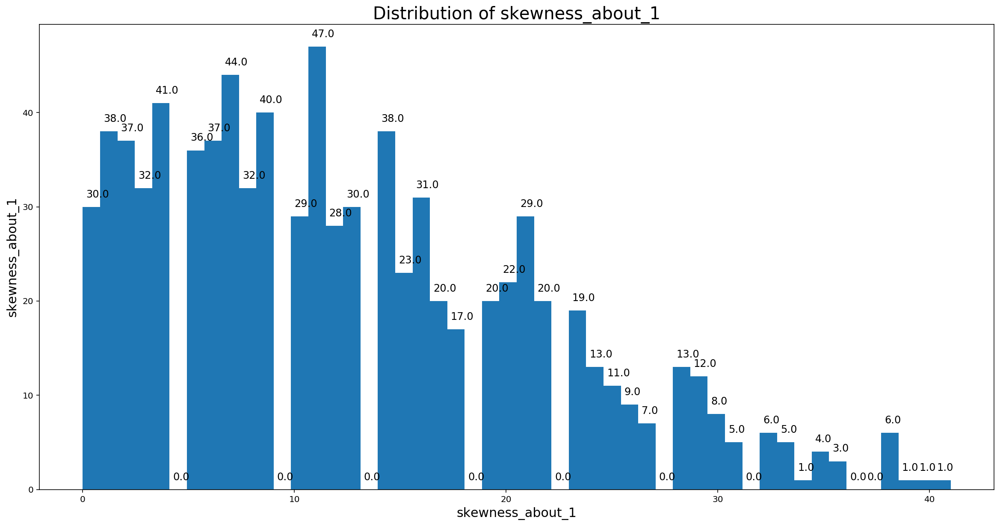

In [91]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("skewness_about_1", fontsize = 15)

ax.set_ylabel("skewness_about_1", fontsize = 15)

ax.set_title("Distribution of skewness_about_1", fontsize = 20)

plt.hist(data.skewness_about_1,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data is skewed right

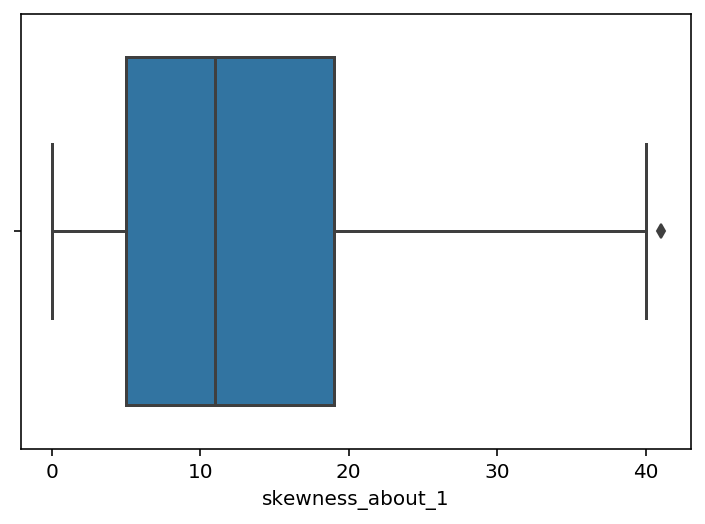

In [92]:
sns.boxplot(x=data['skewness_about_1'], data=data)

### skewness_about_2 

In [93]:
print("Min Value = ", data.skewness_about_2.quantile(0))
print("Q1 or 25% = ", data.skewness_about_2.quantile(0.25))
print("Q2/Median = ", data.skewness_about_2.quantile(0.5))
print("Q3 or 75% = ", data.skewness_about_2.quantile(0.75))
print("Max value = ", data.skewness_about_2.quantile(1))
print("Interquartile Range = ", stats.iqr(data.skewness_about_2))
print("Mean value = %.3f" % np.mean(data.skewness_about_2))
print("The list of outliers is: ")

Min Value =  176.0
Q1 or 25% =  184.0
Q2/Median =  188.0
Q3 or 75% =  193.0
Max value =  206.0
Interquartile Range =  9.0
Mean value = 188.918
The list of outliers is: 


In [94]:
outliers(data.skewness_about_2)

[]


In [95]:
out = []

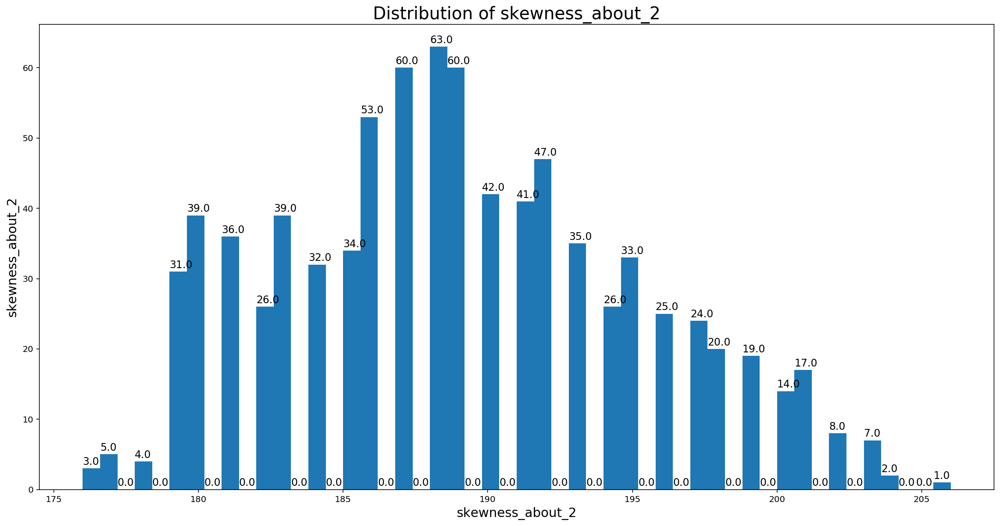

In [96]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("skewness_about_2", fontsize = 15)

ax.set_ylabel("skewness_about_2", fontsize = 15)

ax.set_title("Distribution of skewness_about_2", fontsize = 20)

plt.hist(data.skewness_about_2,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0, i.get_height()+0.5, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data seems to be skewed right slightly

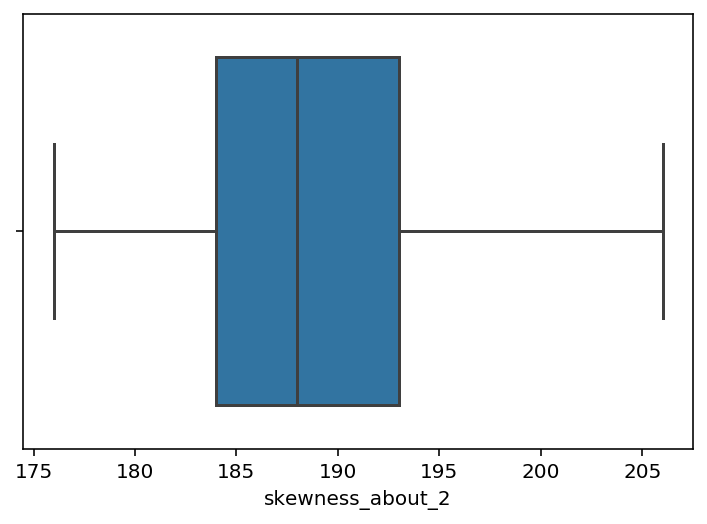

In [97]:
sns.boxplot(x=data['skewness_about_2'], data=data)

### hollows_ratio 

In [98]:
print("Min Value = ", data.hollows_ratio.quantile(0))
print("Q1 or 25% = ", data.hollows_ratio.quantile(0.25))
print("Q2/Median = ", data.hollows_ratio.quantile(0.5))
print("Q3 or 75% = ", data.hollows_ratio.quantile(0.75))
print("Max value = ", data.hollows_ratio.quantile(1))
print("Interquartile Range = ", stats.iqr(data.hollows_ratio))
print("Mean value = %.3f" % np.mean(data.hollows_ratio))
print("The list of outliers is: ")

Min Value =  181.0
Q1 or 25% =  190.25
Q2/Median =  197.0
Q3 or 75% =  201.0
Max value =  211.0
Interquartile Range =  10.75
Mean value = 195.632
The list of outliers is: 


In [99]:
outliers(data.hollows_ratio)

[]


In [100]:
out = []

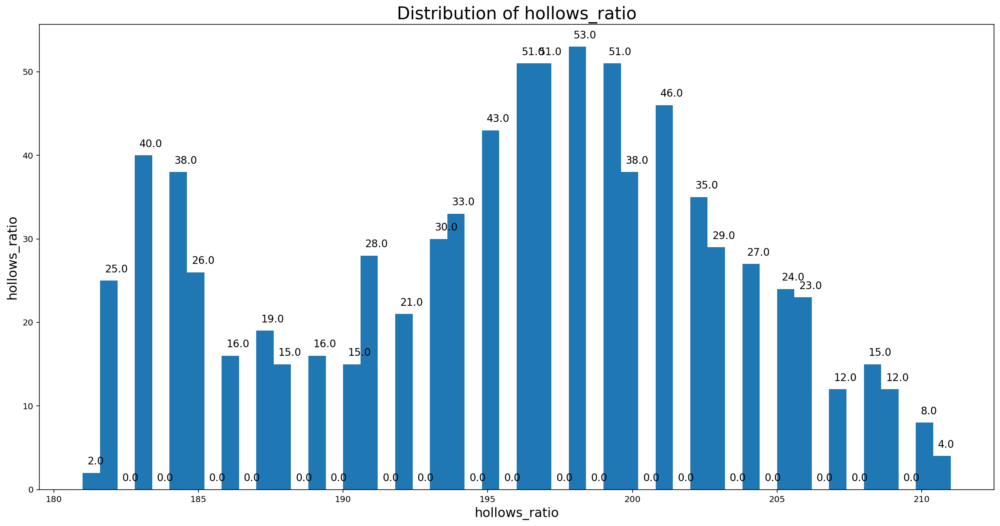

In [101]:
fig, ax = plt.subplots()

fig.set_size_inches(20,10)

ax.set_xlabel("hollows_ratio", fontsize = 15)

ax.set_ylabel("hollows_ratio", fontsize = 15)

ax.set_title("Distribution of hollows_ratio", fontsize = 20)

plt.hist(data.hollows_ratio,bins = 50, histtype = 'bar');
for i in ax.patches:
    ax.text(i.get_x()+0.16, i.get_height()+1, str(round((i.get_height()), 1)), fontsize=12, color='black')

Data seems to be slightly skewed left

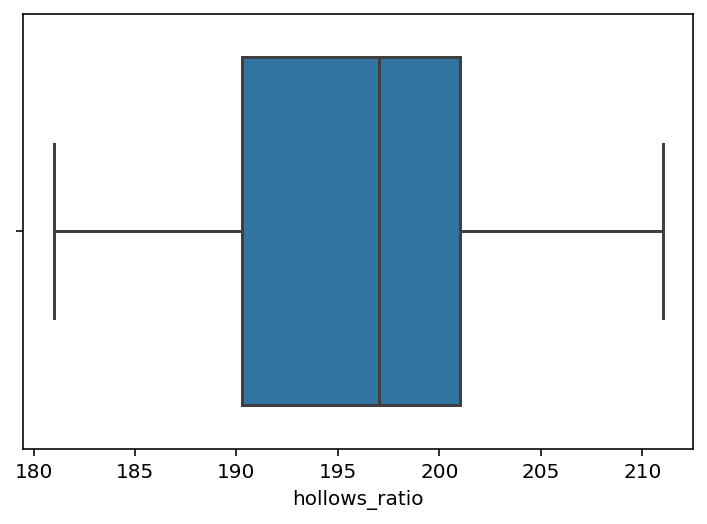

In [102]:
sns.boxplot(x=data['hollows_ratio'], data=data)

**We have finished our basic univariate analysis. We see a lot of outliers are there, as seen below**

In [103]:
for col_name in data.columns[:-1]:
    q1 = data[col_name].quantile(0.25)
    q3 = data[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    print(data.loc[(data[col_name] < low) | (data[col_name] > high), col_name])

Series([], Name: compactness, dtype: int64)
Series([], Name: circularity, dtype: float64)
Series([], Name: distance_circularity, dtype: float64)
37     306.0
135    322.0
388    333.0
Name: radius_ratio, dtype: float64
4      103.0
37     126.0
100    126.0
135    133.0
291    102.0
388    138.0
523     97.0
706    105.0
Name: pr_axis_aspect_ratio, dtype: float64
4      52
37     49
100    52
127    22
135    48
291    43
388    49
391    25
523    46
544    19
655     2
706    55
815    22
Name: max_length_aspect_ratio, dtype: int64
Series([], Name: scatter_ratio, dtype: float64)
Series([], Name: elongatedness, dtype: float64)
Series([], Name: pr_axis_rectangularity, dtype: float64)
Series([], Name: max_length_rectangularity, dtype: int64)
388    320.0
Name: scaled_variance, dtype: float64
85      998.0
835    1018.0
Name: scaled_variance_1, dtype: float64
Series([], Name: scaled_radius_of_gyration, dtype: float64)
4      127.0
37     118.0
47      88.0
79      88.0
100    119.0
135  

**Before moving on, we have to replace the outliers (which we found a lot of) with the median value of the dataset**

In [104]:
for col_name in data.columns[:-1]:
    q1 = data[col_name].quantile(0.25)
    q3 = data[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    data.loc[(data[col_name] < low) | (data[col_name] > high), col_name] = data[col_name].median()

In [105]:
data.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.823877,82.100473,168.330969,61.154846,8.118203,168.887707,40.936170,20.580378,147.998818,188.430260,437.790780,174.706856,71.943853,6.147754,12.565012,188.918440,195.632388
std,8.234474,6.134272,15.741569,32.147908,5.613458,2.064114,33.197710,7.811882,2.588558,14.515652,31.034232,174.346065,32.546277,6.158852,4.572950,8.877465,6.152247,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,3.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.250000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,194.750000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,216.750000,586.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,252.000000,76.000000,13.000000,265.000000,61.000000,29.000000,188.000000,288.000000,987.000000,268.000000,87.000000,19.000000,40.000000,206.000000,211.000000


In [106]:
original.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr_axis_aspect_ratio,max_length_aspect_ratio,scatter_ratio,elongatedness,pr_axis_rectangularity,max_length_rectangularity,scaled_variance,scaled_variance_1,scaled_radius_of_gyration,scaled_radius_of_gyration_1,skewness_about,skewness_about_1,skewness_about_2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [107]:
for col_name in data.columns[:-1]:
    q1 = data[col_name].quantile(0.25)
    q3 = data[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    print(data.loc[(data[col_name] < low) | (data[col_name] > high), col_name])

Series([], Name: compactness, dtype: float64)
Series([], Name: circularity, dtype: float64)
Series([], Name: distance_circularity, dtype: float64)
Series([], Name: radius_ratio, dtype: float64)
Series([], Name: pr_axis_aspect_ratio, dtype: float64)
Series([], Name: max_length_aspect_ratio, dtype: float64)
Series([], Name: scatter_ratio, dtype: float64)
Series([], Name: elongatedness, dtype: float64)
Series([], Name: pr_axis_rectangularity, dtype: float64)
Series([], Name: max_length_rectangularity, dtype: float64)
Series([], Name: scaled_variance, dtype: float64)
Series([], Name: scaled_variance_1, dtype: float64)
Series([], Name: scaled_radius_of_gyration, dtype: float64)
Series([], Name: scaled_radius_of_gyration_1, dtype: float64)
Series([], Name: skewness_about, dtype: float64)
Series([], Name: skewness_about_1, dtype: float64)
Series([], Name: skewness_about_2, dtype: float64)
Series([], Name: hollows_ratio, dtype: float64)


**As seen above, we do not have any outliers left in our dataset. Now, we can move on with bi-variate analysis**

## Bi-Variate Analysis 

### compactness  

class
bus    91.6
car    96.2
van    90.6
Name: compactness, dtype: float64


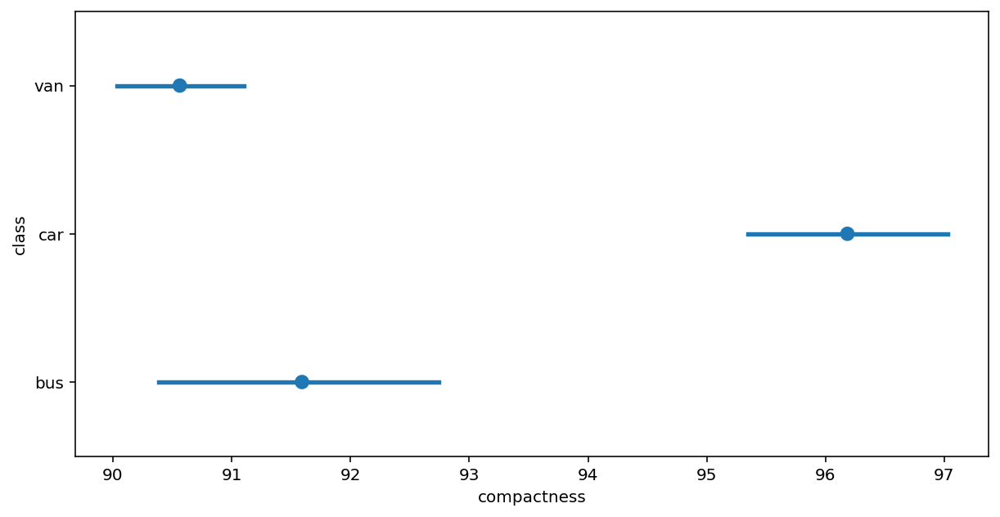

In [108]:
print(np.round(data.iloc[:,0].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,0],y=data['class'], join = False, ax = ax)

### circularity

class
bus    45.0
car    46.0
van    42.1
Name: circularity, dtype: float64


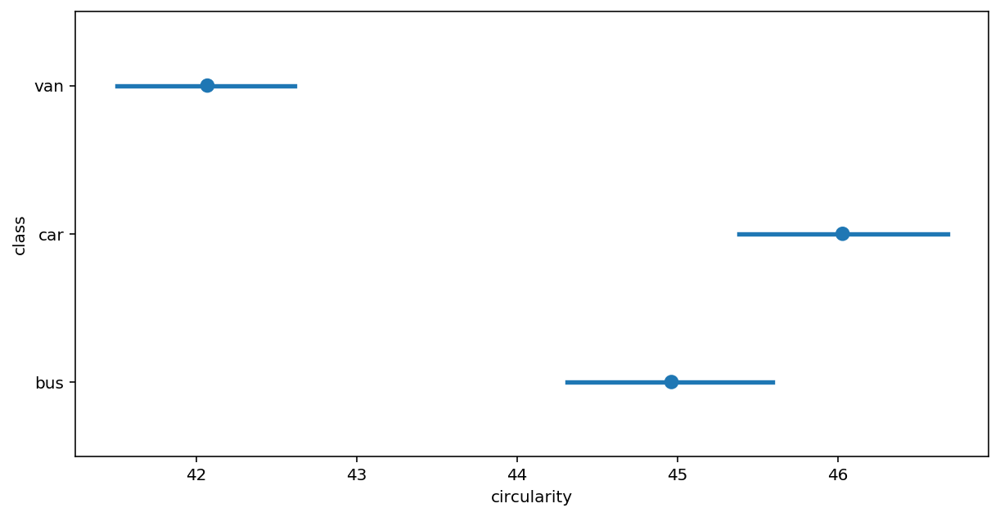

In [109]:
print(np.round(data.iloc[:,1].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,1],y=data['class'], join = False, ax = ax)

### distance_circularity 

class
bus    76.8
car    88.9
van    73.3
Name: distance_circularity, dtype: float64


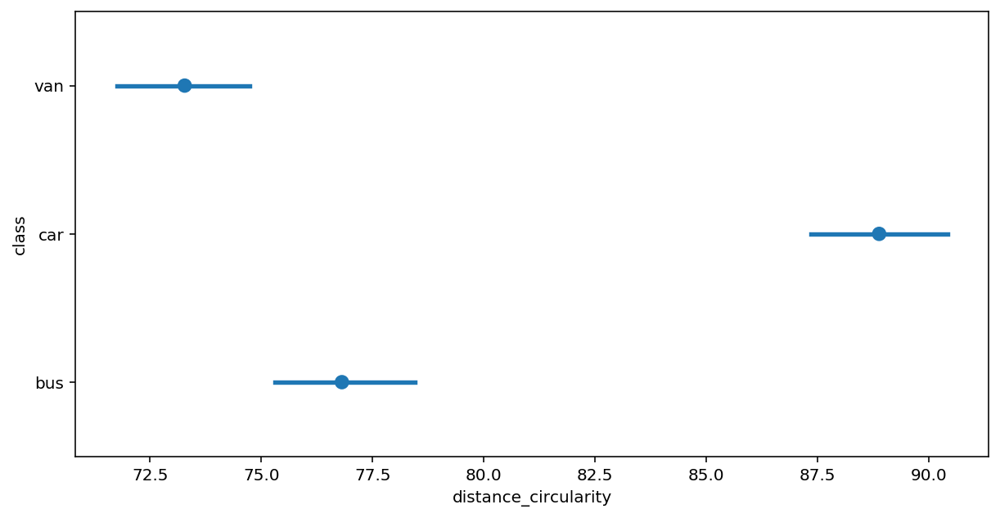

In [110]:
print(np.round(data.iloc[:,2].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,2],y=data['class'], join = False, ax = ax)

### radius_ratio

class
bus    165.7
car    180.5
van    145.0
Name: radius_ratio, dtype: float64


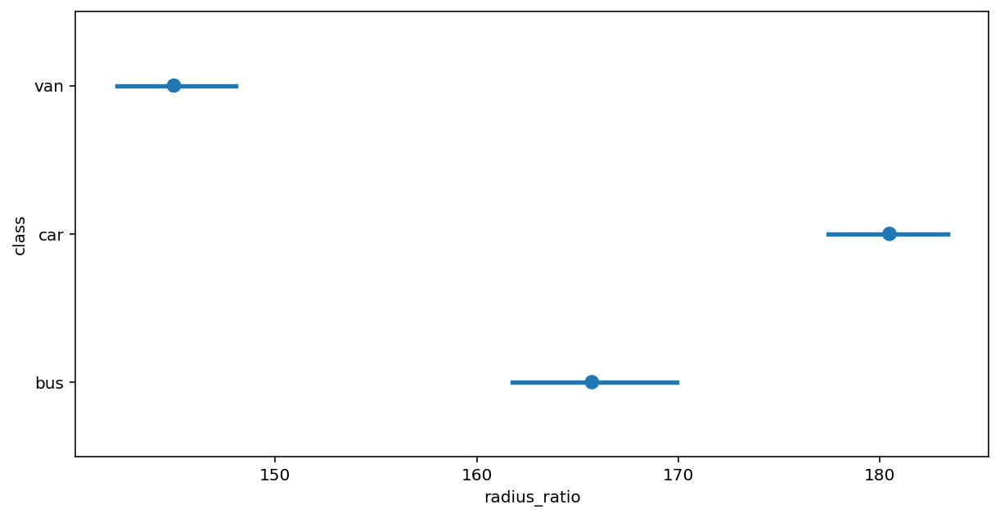

In [111]:
print(np.round(data.iloc[:,3].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,3],y=data['class'], join = False, ax = ax)

### pr_axis_aspect_ratio	

class
bus    62.9
car    61.0
van    59.6
Name: pr_axis_aspect_ratio, dtype: float64


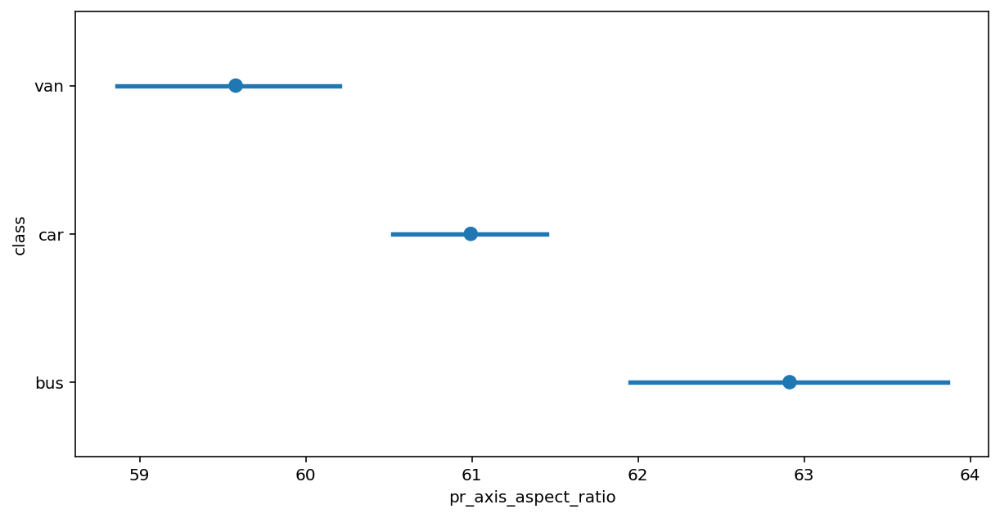

In [112]:
print(np.round(data.iloc[:,4].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,4],y=data['class'], join = False, ax = ax)

### max_length_aspect_ratio	 

class
bus    6.4
car    8.8
van    8.4
Name: max_length_aspect_ratio, dtype: float64


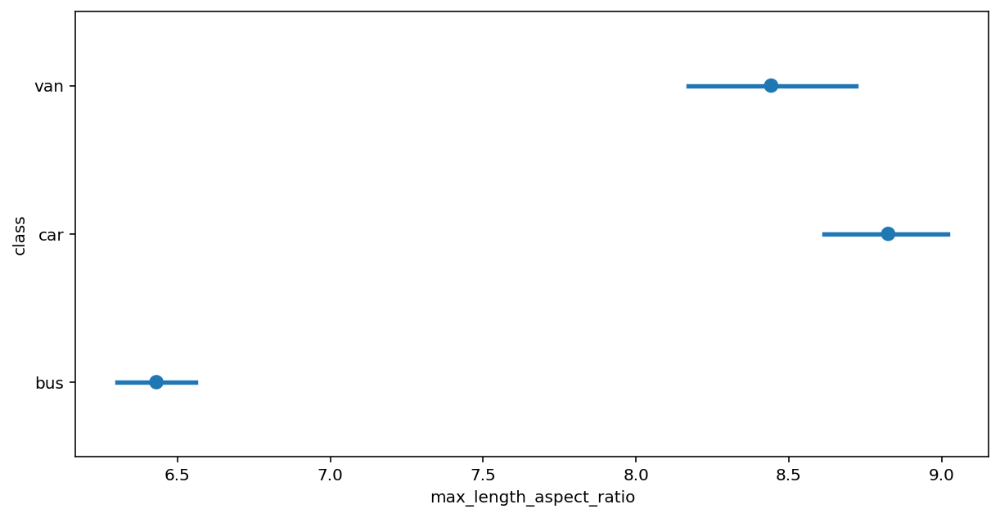

In [113]:
print(np.round(data.iloc[:,5].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,5],y=data['class'], join = False, ax = ax)

### scatter_ratio	

class
bus    170.0
car    181.0
van    141.5
Name: scatter_ratio, dtype: float64


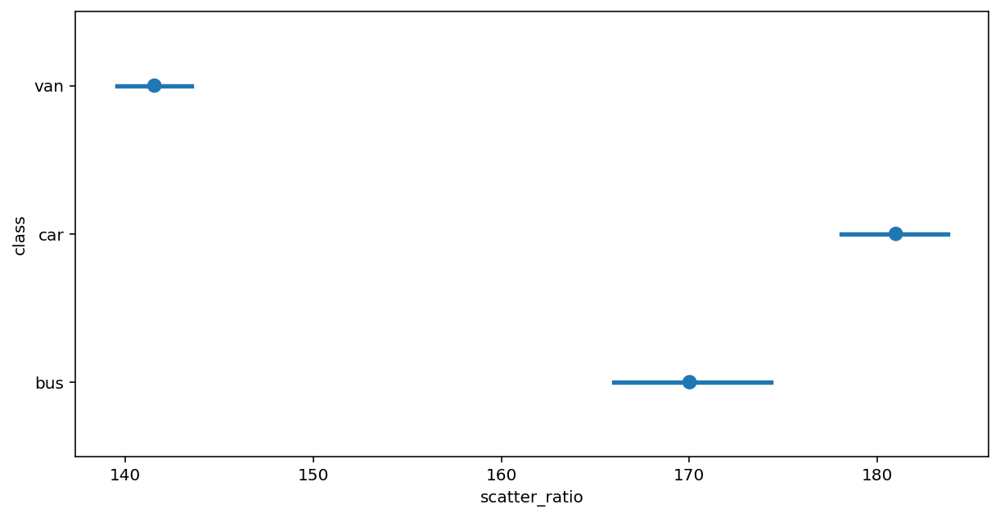

In [114]:
print(np.round(data.iloc[:,6].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,6],y=data['class'], join = False, ax = ax)

### elongatedness 

class
bus    40.1
car    38.1
van    47.9
Name: elongatedness, dtype: float64


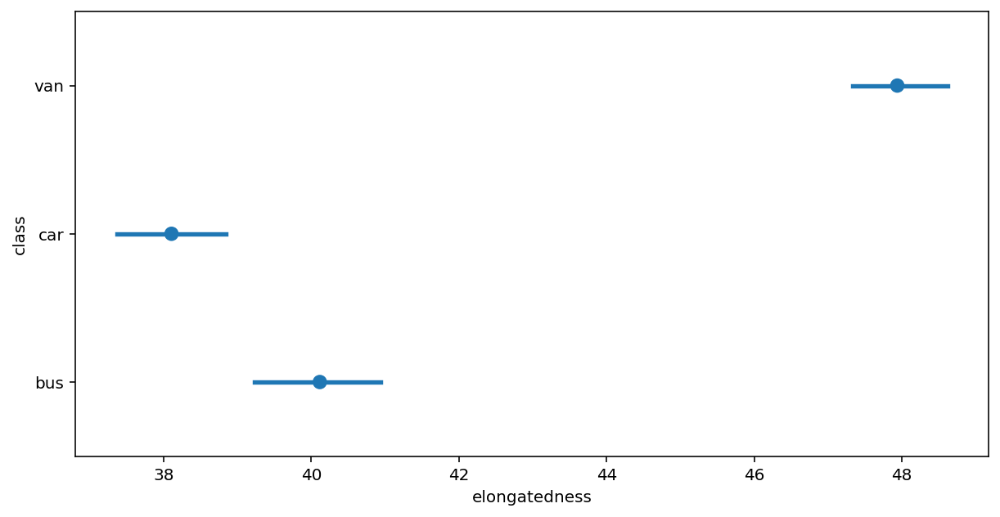

In [115]:
print(np.round(data.iloc[:,7].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,7],y=data['class'], join = False, ax = ax)

### pr_axis_rectangularity	 

class
bus    20.6
car    21.5
van    18.6
Name: pr_axis_rectangularity, dtype: float64


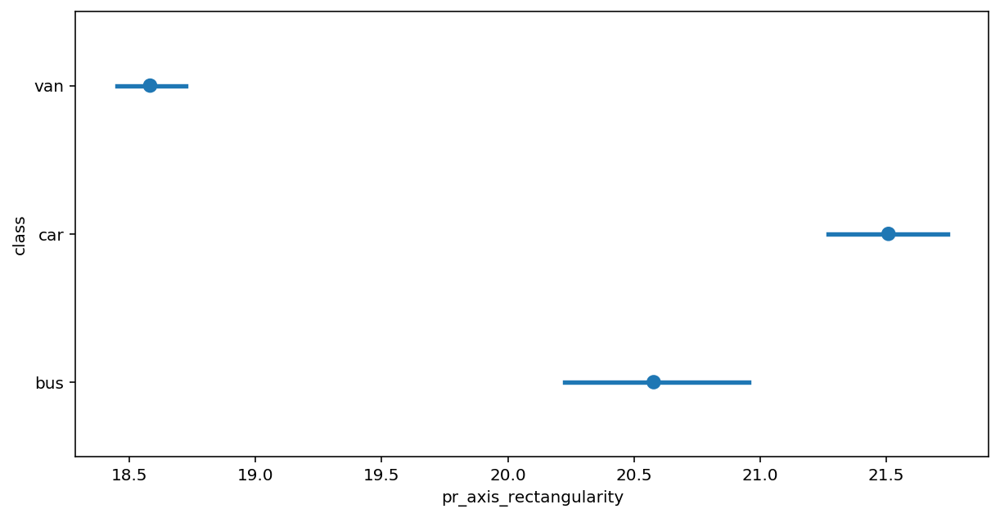

In [116]:
print(np.round(data.iloc[:,8].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,8],y=data['class'], join = False, ax = ax)

### max_length_rectangularity	

class
bus    146.7
car    150.0
van    145.2
Name: max_length_rectangularity, dtype: float64


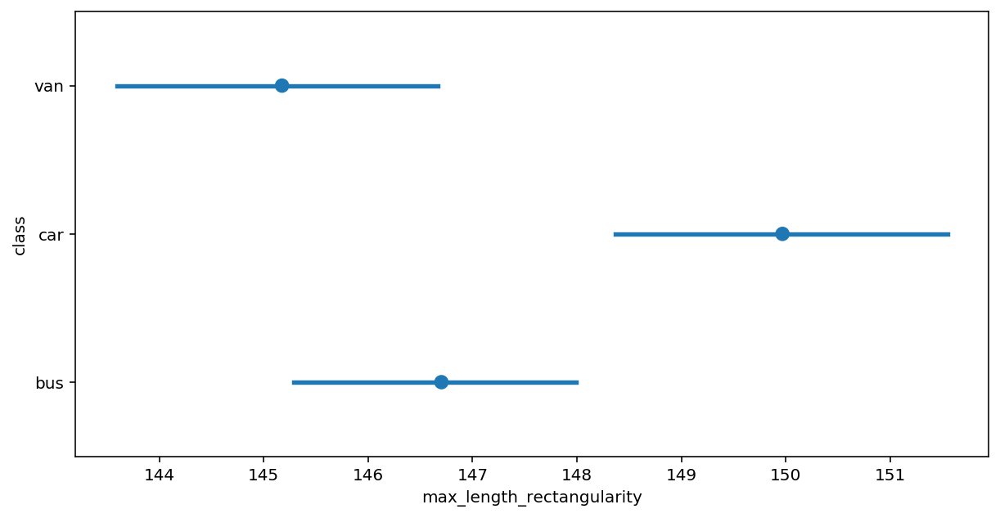

In [117]:
print(np.round(data.iloc[:,9].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,9],y=data['class'], join = False, ax = ax)

### scaled_variance

class
bus    192.9
car    197.8
van    163.3
Name: scaled_variance, dtype: float64


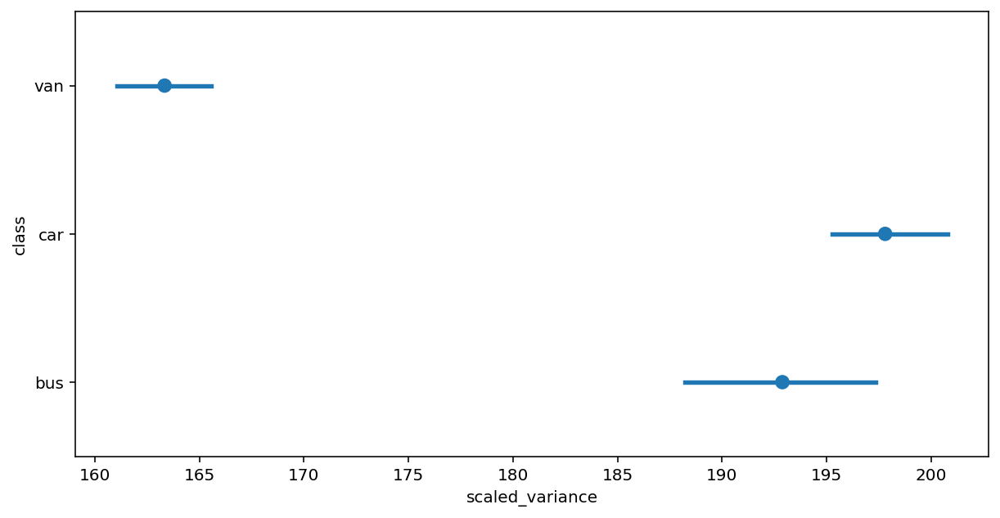

In [118]:
print(np.round(data.iloc[:,10].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,10],y=data['class'], join = False, ax = ax)

### scaled_variance_1

class
bus    443.0
car    499.9
van    298.2
Name: scaled_variance_1, dtype: float64


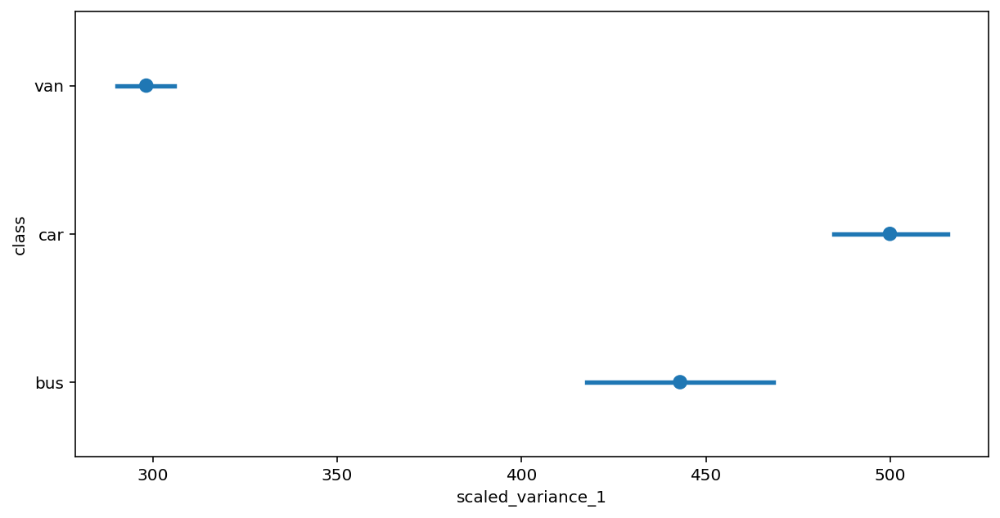

In [119]:
print(np.round(data.iloc[:,11].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,11],y=data['class'], join = False, ax = ax)

### scaled_radius_of_gyration	

class
bus    181.0
car    179.6
van    157.3
Name: scaled_radius_of_gyration, dtype: float64


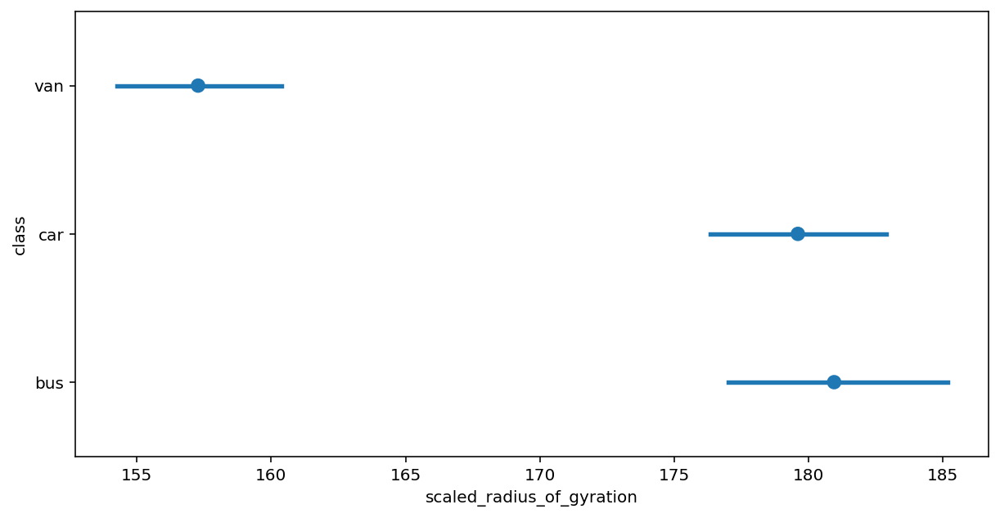

In [120]:
print(np.round(data.iloc[:,12].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,12],y=data['class'], join = False, ax = ax)

### scaled_radius_of_gyration_1

class
bus    76.3
car    69.9
van    71.5
Name: scaled_radius_of_gyration_1, dtype: float64


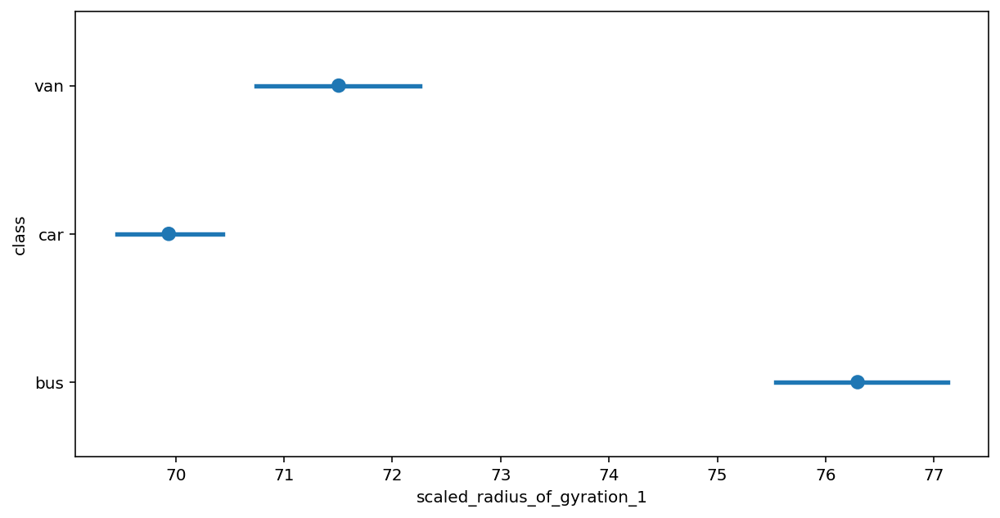

In [121]:
print(np.round(data.iloc[:,13].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,13],y=data['class'], join = False, ax = ax)

### skewness_about

class
bus    4.8
car    6.7
van    6.4
Name: skewness_about, dtype: float64


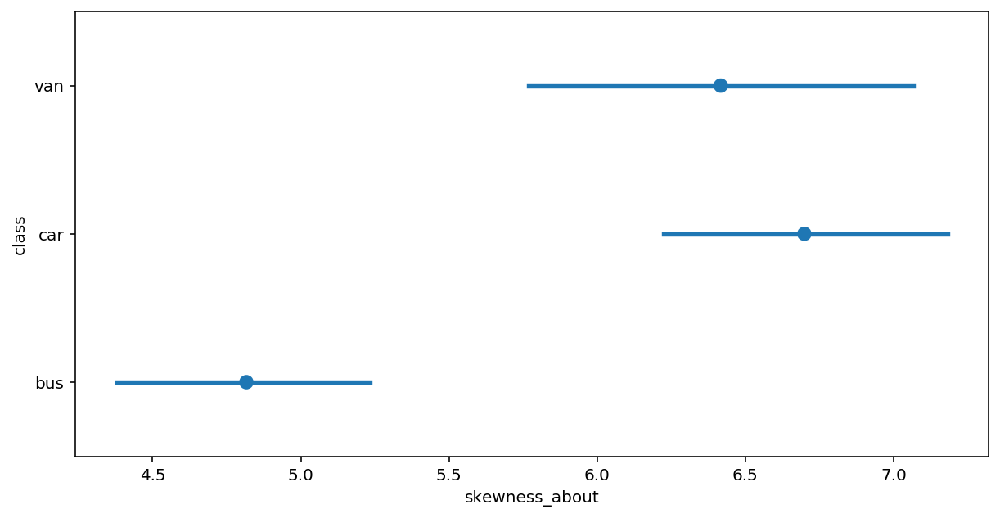

In [122]:
print(np.round(data.iloc[:,14].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,14],y=data['class'], join = False, ax = ax)

### skewness_about_1

class
bus    10.2
car    15.1
van     9.7
Name: skewness_about_1, dtype: float64


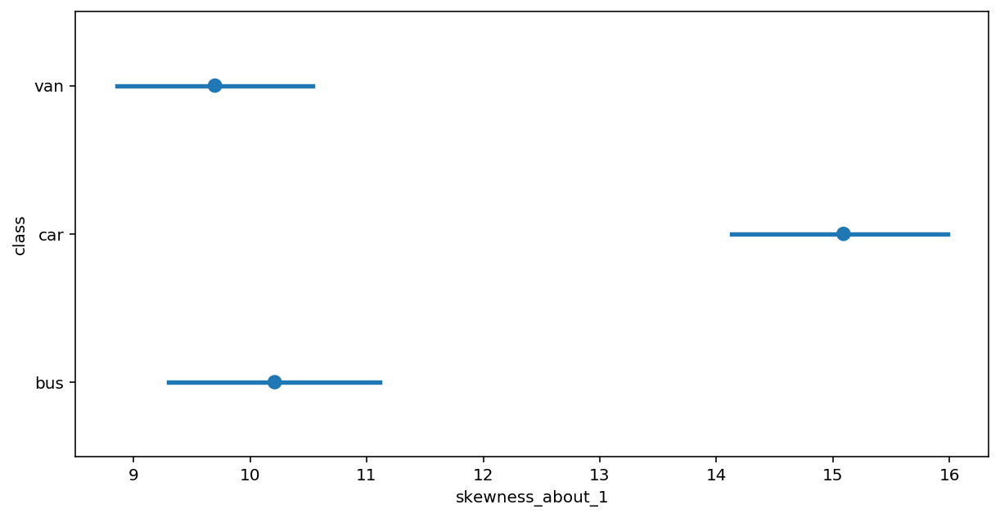

In [123]:
print(np.round(data.iloc[:,15].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,15],y=data['class'], join = False, ax = ax)

### skewness_about_2

class
bus    187.8
car    189.5
van    188.9
Name: skewness_about_2, dtype: float64


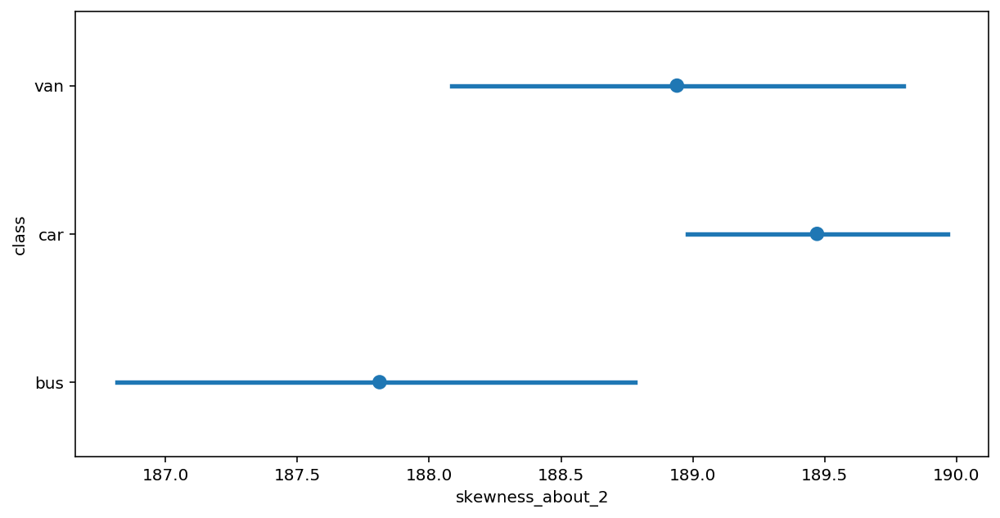

In [124]:
print(np.round(data.iloc[:,16].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,16],y=data['class'], join = False, ax = ax)

### hollows_ratio

class
bus    191.3
car    197.6
van    196.1
Name: hollows_ratio, dtype: float64


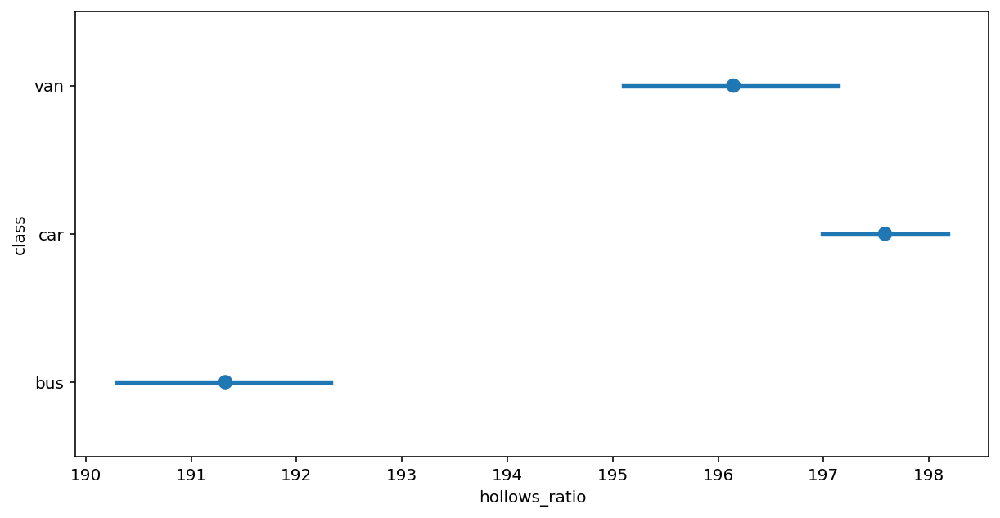

In [125]:
print(np.round(data.iloc[:,17].groupby(data['class']).mean() ,1))
fig, ax = plt.subplots(figsize = (10,5))
sns.pointplot(x=data.iloc[:,17],y=data['class'], join = False, ax = ax)

**We have done bi-variate analysis by checking the distrubution of each variable against the class variable. Due to a busy schedule and lack of time, I am unable to give comments for each, but I understand how the distribution works. We can now move on to multi-variate analysis**

## Multi-Variate Analysis 

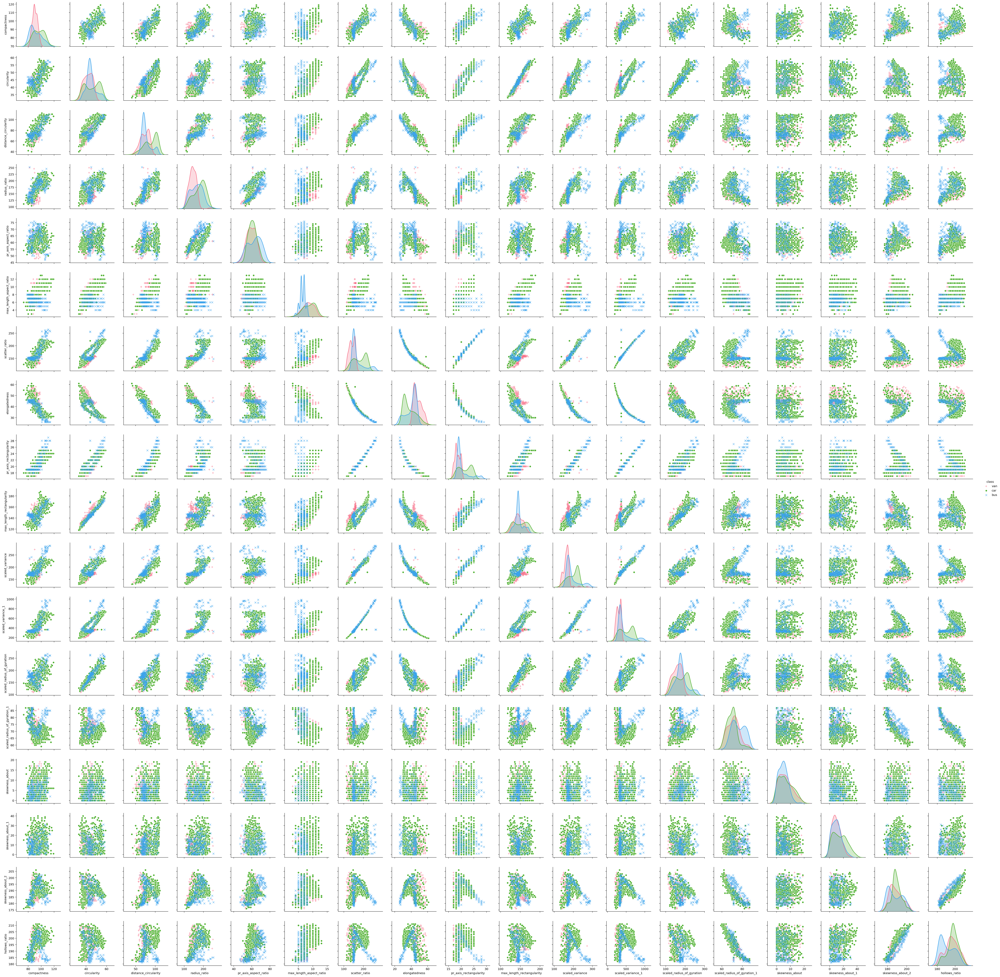

In [126]:
sns.pairplot(data, hue = 'class', markers = ['+', 'o', 'x'], palette="husl");

In [127]:
cor = data.corr()
print(cor)

                             compactness  circularity  distance_circularity  \
compactness                     1.000000     0.684887              0.789928   
circularity                     0.684887     1.000000              0.792320   
distance_circularity            0.789928     0.792320              1.000000   
radius_ratio                    0.721925     0.638280              0.794222   
pr_axis_aspect_ratio            0.192864     0.203253              0.244332   
max_length_aspect_ratio         0.499928     0.560470              0.666809   
scatter_ratio                   0.812620     0.847938              0.905076   
elongatedness                  -0.788750    -0.821472             -0.911307   
pr_axis_rectangularity          0.813694     0.843400              0.893025   
max_length_rectangularity       0.676143     0.961318              0.774527   
scaled_variance                 0.769871     0.802768              0.869584   
scaled_variance_1               0.806170     0.82746

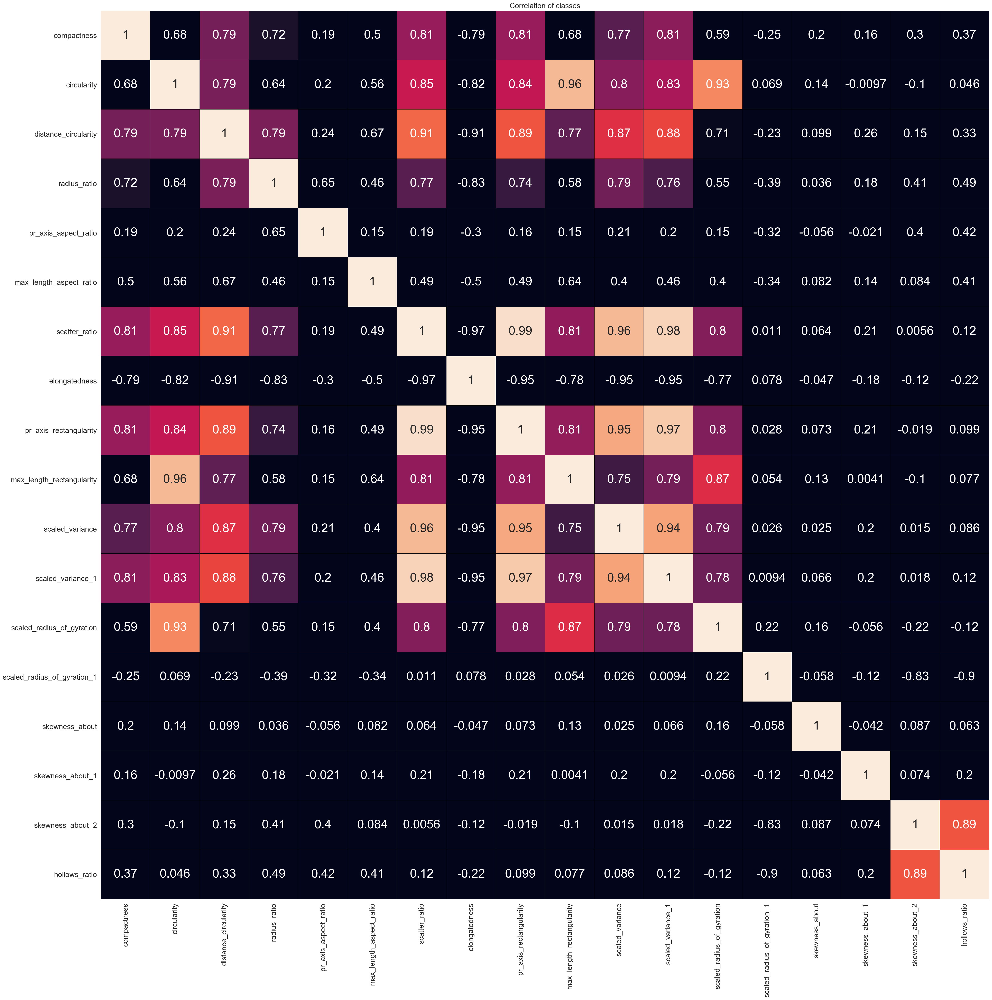

In [128]:
sns.set(font_scale=2.5)
fig,ax=plt.subplots(figsize=(40,40))
sns.heatmap(cor,vmin=0.7, annot=True,linewidths=0.02,linecolor="black",cbar=False,square=True)
plt.title('Correlation of classes',fontsize=18)
ax.tick_params(labelsize=18)

**From what we see above, there are quite a lot of variables which are correlated with each other. We see that where the colours are closer to red, the correlation is very high**

**Now, we can move on to PCA and reduce the dimensions, and use Support Vector Machine and use grid search to find best hyper parameters and do cross validation to find the accuracy** 

# Part 3: PCA and SVM 

**Let us set all independant variables as X, dependent as Y**

In [129]:
X = data.iloc[:,0:17]
Y = data.iloc[:,18]

**Now, we will apply PCA and see which is the no. of dimensions which covers at least 95% variance**

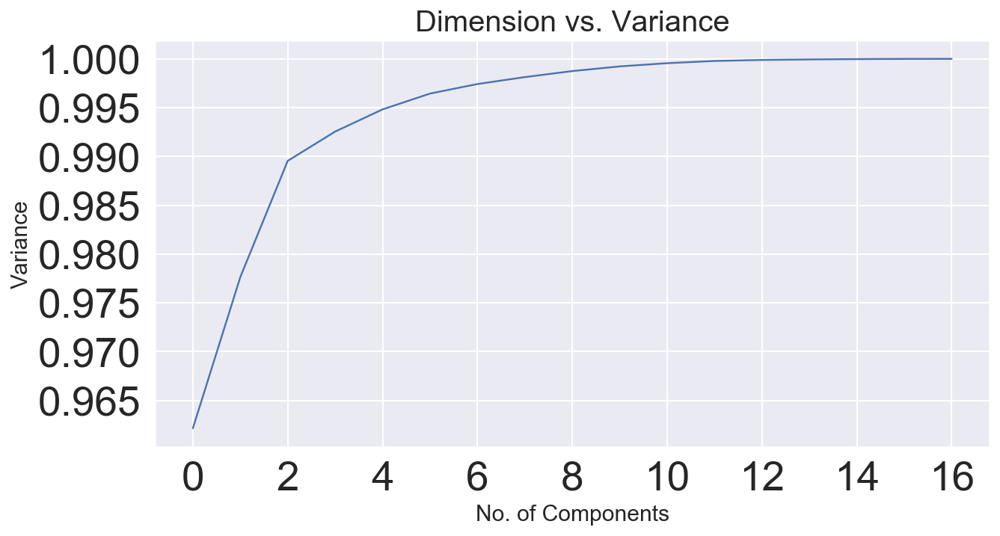

In [130]:
pca = PCA().fit(X)
fig, ax = plt.subplots(figsize = (10,5))
ax.set_xlabel("No. of Components", fontsize = 15)

ax.set_ylabel("Variance", fontsize = 15)

ax.set_title("Dimension vs. Variance", fontsize = 20)
ax.set_xticks(np.arange(0,15), minor=True)
sns.set_context("paper")

sns.lineplot(data=np.cumsum(pca.explained_variance_ratio_), ax=ax)

**As seen above, we see that the best fit to high number of variance is between 8 - 10**

**Based on above, we can select 8 as the number of components**

In [131]:
pca = PCA(n_components=10)
pca.fit(X)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

**Assign the components to X variable**

In [132]:
X = pca.transform(X)

**Now, we shall split the data into train and test sets**

In [133]:
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(X, Y, test_size=0.3, random_state=10)

**Now, we will apply GaussianNB and SVM. First we will Apply grid search with C = 0.01, 0.1,  0.5 and 1 and find best hyper parameters**

In [134]:
model = SVC()

params = {'C': [0.01, 0.1, 0.5, 1], 'kernel': ['linear', 'rbf']}

model1 = GridSearchCV(model, param_grid=params, verbose=5)

model1.fit(X_train, Y_train)

print("Best Hyper Parameters:\n", model1.best_params_)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] C=0.01, kernel=linear ...........................................
[CV] ............... C=0.01, kernel=linear, score=0.833, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] ............... C=0.01, kernel=linear, score=0.832, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] ............... C=0.01, kernel=linear, score=0.878, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] .................. C=0.01, kernel=rbf, score=0.515, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] .................. C=0.01, kernel=rbf, score=0.513, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] .................. C=0.01, kernel=rbf, score=0.513, total=   0.0s
[CV] C=0.1, kernel=linear ............................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


[CV] ................ C=0.1, kernel=linear, score=0.833, total=   0.1s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.838, total=   0.1s
[CV] C=0.1, kernel=linear ............................................
[CV] ................ C=0.1, kernel=linear, score=0.878, total=   0.1s
[CV] C=0.1, kernel=rbf ...............................................
[CV] ................... C=0.1, kernel=rbf, score=0.515, total=   0.0s
[CV] C=0.1, kernel=rbf ...............................................
[CV] ................... C=0.1, kernel=rbf, score=0.513, total=   0.0s
[CV] C=0.1, kernel=rbf ...............................................
[CV] ................... C=0.1, kernel=rbf, score=0.513, total=   0.0s
[CV] C=0.5, kernel=linear ............................................
[CV] ................ C=0.5, kernel=linear, score=0.838, total=   1.5s
[CV] C=0.5, kernel=linear ............................................
[CV] .

[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    6.6s finished


Best Hyper Parameters:
 {'C': 0.1, 'kernel': 'linear'}


**As seen above, we find that the best parameters are with C=0.1, and using a linear kernel. Now we shall build the model with the best parameters and do k fold cross validation**

In [135]:
model = SVC(C=0.1, kernel="linear")

scores = cross_val_score(model, X, Y, cv=10)

print(scores)

[0.81176471 0.85882353 0.85882353 0.85882353 0.82352941 0.83529412
 0.89411765 0.82352941 0.85714286 0.84146341]


**Now, we will use the Naive Bayes Classifier with k fold cross validation**

In [136]:
model = GaussianNB()

scores = cross_val_score(model, X, Y, cv=10)

print(scores)

[0.74117647 0.78823529 0.75294118 0.75294118 0.8        0.76470588
 0.78823529 0.68235294 0.76190476 0.79268293]


# Part 4: Conculsion 

**As seen above, we find that the better model is the Support Vector Machine Classification as compared to GaussianNB, as seen from our difference in score**

**This concludes the project. I feel that I could have done a lot better, especially with the lack of explaination in EDA and attempting more models and do cross-validation and compare. I would also have liked to try different dimensions reduced. However, due to a busy schedule and lack of time, I was unable to go in deeper. With this, I end the project**